## Negative Sentiment Analysis - Topic Modeling

In [107]:
import torch

print("CUDA is available:" , torch.cuda.is_available())
print("Number of CUDA devices:", torch.cuda.device_count())
print("CUDA version used by PyTorch:", torch.version.cuda)

for i in range(torch.cuda.device_count()):
    print(torch.cuda.get_device_name(i)) # prints the name of each available GPU

CUDA is available: True
Number of CUDA devices: 2
CUDA version used by PyTorch: 11.6
Tesla T4
Tesla T4


In [351]:
import numpy as np
import pandas as pd
# from gensim import corpora, models
# from gensim.models import Phrases
# from gensim.models import CoherenceModel
# from gensim.models.ldamodel import LdaModel
# from gensim.models.ldamulticore import LdaMulticore
import spacy
from spacy import displacy

#import pyLDAvis
#import pyLDAvis.gensim_models as gensimvis
from tqdm import tqdm

import re
import nltk
import os
import seaborn as sns

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 600)

In [5]:
#nltk.download('stopwords')

In [6]:
#!pip install gensim

In [7]:
#!pip install pyLDAvis

In [8]:
#!pip install nltk

In [9]:
#!pip install pyarrow    

In [10]:
#save this dataframe so i do not have to keep reading it in
#df_news_final_project.to_parquet('news_final_project.parquet', engine='pyarrow')
#where does it save?
#!ls

In [11]:
#!pip install pandarallel

In [117]:
import pandarallel
from pandarallel import pandarallel

In [118]:
import multiprocessing

num_processors = multiprocessing.cpu_count()

# Now you can use num_processors in your code.


In [352]:
pandarallel.initialize(nb_workers=num_processors-1, use_memory_fs=False)

INFO: Pandarallel will run on 31 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [4]:
%%time

df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')
df_negative.shape

CPU times: user 899 ms, sys: 588 ms, total: 1.49 s
Wall time: 2.78 s


(46684, 5)

# Entity Extraction from Negative Sentiment

In [6]:
# nlp = spacy.load("en_core_web_sm",exclude=['tok2vec','lemmatizer'])
nlp = spacy.load("en_core_web_lg",exclude=['tok2vec','lemmatizer'])


In [8]:
df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')


In [7]:
spacy_content_df = pd.read_parquet('content_clean_spacy_final_project.parquet', engine='pyarrow')


In [8]:
#add spacy text (not lower cased and unclean) to the negative topics dataframe
df_negative = pd.merge(df_negative, spacy_content_df[["content_clean", "url"]], left_on="url", right_on="url", how="inner")
#df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [110]:
df_negative.shape

(46013, 6)

# Entity extraction on negative news articles

In [34]:
df_analysis_sample = df_negative.sample(n=46013)  # Adjust the sample size as needed


In [36]:
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])


In [100]:
%%time
# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 5min 16s, sys: 15.3 s, total: 5min 32s
Wall time: 30min 22s


In [101]:
# Example: Accessing the top entities for 'ORG'
top_org_entities_neg = df_entities_by_label['ORG']
top_person_entities_neg = df_entities_by_label['PERSON']
top_product_entities_neg = df_entities_by_label['PRODUCT']


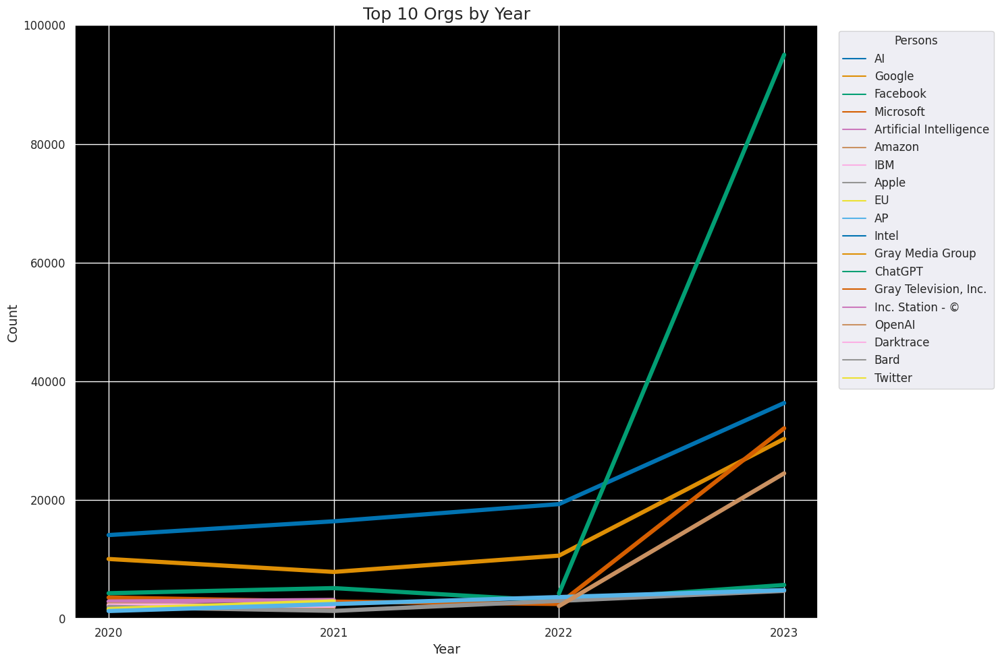

In [113]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Reset the index of the DataFrame so 'year' becomes a column
top_person_entities_neg_reset = top_org_entities_neg.reset_index()

# Rename the columns for clarification
top_person_entities_neg_reset = top_person_entities_neg_reset.rename(columns={'index': 'Entity'})

# Melt the DataFrame to make it suitable for plotting
df_melted = top_person_entities_neg_reset.melt(id_vars='Entity', var_name='Year', value_name='Count')

# Ensure 'Year' is integer for plotting
df_melted['Year'] = df_melted['Year'].astype(int)

# Select the top 10 entities for each year based on count
top_10_each_year = df_melted.groupby('Year').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

# Define a custom color palette for better differentiation of lines
custom_palette = sns.color_palette("colorblind", n_colors=len(top_10_each_year['Entity'].unique()))

# Create line plot with seaborn and custom palette
plt.figure(figsize=(15, 10))
sns.lineplot(data=top_10_each_year, x='Year', y='Count', hue='Entity', palette=custom_palette, linewidth=4.5)

# Set plot title and labels
plt.title('Top 10 Orgs by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Persons', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Set y-axis limit
plt.ylim(0, 100000)

# Customize ticks and tick labels
plt.xticks([2020, 2021, 2022, 2023], fontsize=12)
plt.yticks(fontsize=12)

# Remove the right and top spines
plt.gca().spines['right'].set_visible(True)
plt.gca().spines['top'].set_visible(True)

# Adjust legend location
plt.legend(title='Persons', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12)
# Set the style and context using Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

# Set background color
plt.gca().set_facecolor('#000000')

plt.tight_layout()
plt.show()


In [98]:
top_person_entities_neg.head(5)

,2020,2021,2022,2023
Trump,2086.0,797.0,599.0,4316.0
Gebru,1048.0,740.0,76.0,20.0
Biden,503.0,1643.0,1183.0,3489.0
Musk,464.0,346.0,841.0,5165.0
Elon Musk,452.0,457.0,1150.0,5105.0


In [103]:
top_org_entities_neg.columns = ['2020', '2021', '2022', '2023']
top_person_entities_neg.columns = ['2020', '2021', '2022', '2023']
top_product_entities_neg.columns = ['2020', '2021', '2022', '2023']


In [104]:
top_org_entities_neg.to_parquet('top_org_entities_neg.parquet', engine='pyarrow')
# top_person_entities_neg.to_parquet('top_person_entities_neg.parquet', engine='pyarrow')
# top_product_entities_neg.to_parquet('top_product_entities_neg.parquet', engine='pyarrow')

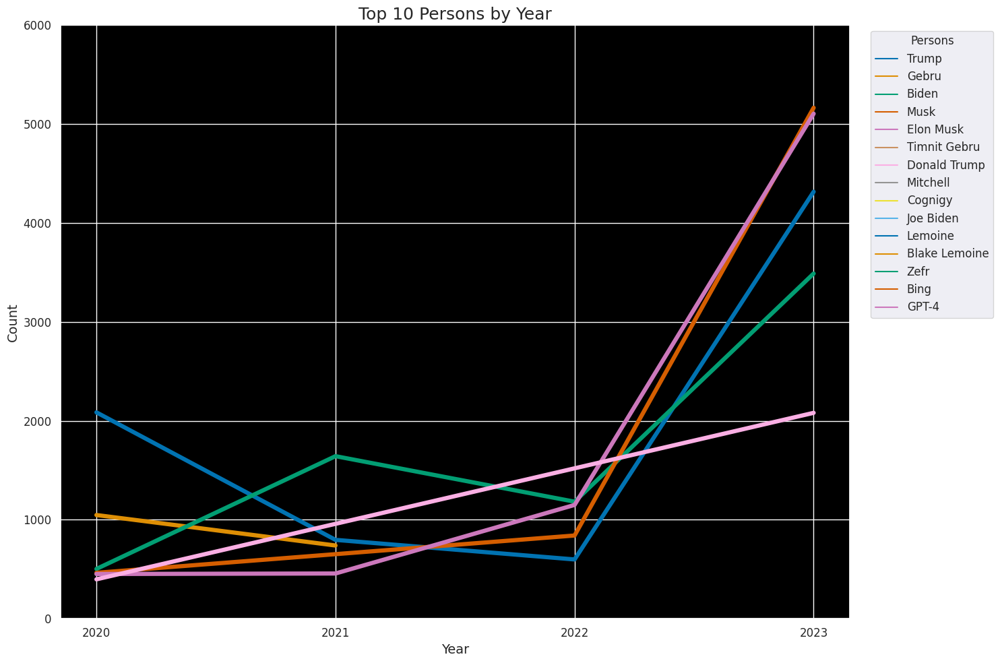

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Reset the index of the DataFrame so 'year' becomes a column
top_person_entities_neg_reset = top_person_entities_neg.reset_index()

# Rename the columns for clarification
top_person_entities_neg_reset = top_person_entities_neg_reset.rename(columns={'index': 'Entity'})

# Melt the DataFrame to make it suitable for plotting
df_melted = top_person_entities_neg_reset.melt(id_vars='Entity', var_name='Year', value_name='Count')

# Ensure 'Year' is integer for plotting
df_melted['Year'] = df_melted['Year'].astype(int)

# Select the top 10 entities for each year based on count
top_10_each_year = df_melted.groupby('Year').apply(lambda x: x.nlargest(7, 'Count')).reset_index(drop=True)

# Define a custom color palette for better differentiation of lines
custom_palette = sns.color_palette("colorblind", n_colors=len(top_10_each_year['Entity'].unique()))

# Create line plot with seaborn and custom palette
plt.figure(figsize=(15, 10))
sns.lineplot(data=top_10_each_year, x='Year', y='Count', hue='Entity', palette=custom_palette, linewidth=4.5)

# Set plot title and labels
plt.title('Top 10 Persons by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Persons', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Set y-axis limit
plt.ylim(0, 6000)

# Customize ticks and tick labels
plt.xticks([2020, 2021, 2022, 2023], fontsize=12)
plt.yticks(fontsize=12)

# Remove the right and top spines
plt.gca().spines['right'].set_visible(True)
plt.gca().spines['top'].set_visible(True)

# Adjust legend location
plt.legend(title='Persons', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12)
# Set the style and context using Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

# Set background color
plt.gca().set_facecolor('#000000')

plt.tight_layout()
plt.show()


In [42]:
top_product_entities_neg.head(5)

year,2020,2021,2022,2023
AI,22321.0,26272.0,38058.0,78760.0
Facebook,280.0,292.0,263.0,731.0
YouTube,280.0,239.0,282.0,906.0
Galaxy,274.0,86.0,49.0,306.0
JavaScript,265.0,283.0,241.0,358.0


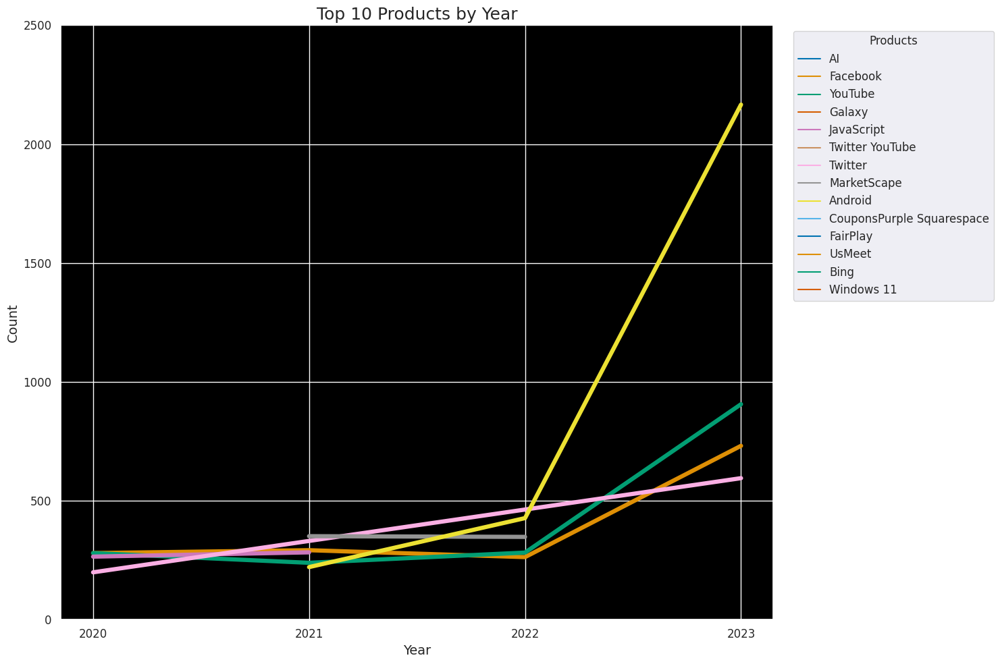

In [116]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Reset the index of the DataFrame so 'year' becomes a column
top_person_entities_neg_reset = top_product_entities_neg.reset_index()

# Rename the columns for clarification
top_person_entities_neg_reset = top_person_entities_neg_reset.rename(columns={'index': 'Entity'})

# Melt the DataFrame to make it suitable for plotting
df_melted = top_person_entities_neg_reset.melt(id_vars='Entity', var_name='Year', value_name='Count')

# Ensure 'Year' is integer for plotting
df_melted['Year'] = df_melted['Year'].astype(int)

# Select the top 10 entities for each year based on count
top_10_each_year = df_melted.groupby('Year').apply(lambda x: x.nlargest(7, 'Count')).reset_index(drop=True)

# Define a custom color palette for better differentiation of lines
custom_palette = sns.color_palette("colorblind", n_colors=len(top_10_each_year['Entity'].unique()))

# Create line plot with seaborn and custom palette
plt.figure(figsize=(15, 10))
sns.lineplot(data=top_10_each_year, x='Year', y='Count', hue='Entity', palette=custom_palette, linewidth=4.5)

# Set plot title and labels
plt.title('Top 10 Products by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Persons', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Set y-axis limit
plt.ylim(0, 2500)

# Customize ticks and tick labels
plt.xticks([2020, 2021, 2022, 2023], fontsize=12)
plt.yticks(fontsize=12)

# Remove the right and top spines
plt.gca().spines['right'].set_visible(True)
plt.gca().spines['top'].set_visible(True)

# Adjust legend location
plt.legend(title='Products', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12)
# Set the style and context using Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

# Set background color
plt.gca().set_facecolor('#000000')

plt.tight_layout()
plt.show()


# BERT Topic modeling (on negative sentiment articles - 46k articles)

In [15]:
# bert topic on the sample above
#!pip install bertopic

In [7]:
from bertopic import BERTopic

pd.set_option('display.max_colwidth', 500)

2023-05-24 01:47:44.780908: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-24 01:47:46.965439: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-24 01:47:46.967385: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-

In [14]:
docs = df_negative['cleaned_text'].tolist()


In [18]:
%%time

topic_model = BERTopic(language="english", min_topic_size=30, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/1459 [00:00<?, ?it/s]

2023-05-19 21:07:26,957 - BERTopic - Transformed documents to Embeddings
2023-05-19 21:08:09,228 - BERTopic - Reduced dimensionality


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

2023-05-19 21:08:12,714 - BERTopic - Clustered reduced embeddings


CPU times: user 25min 2s, sys: 1min 44s, total: 26min 46s
Wall time: 7min 33s


In [19]:
freq = topic_model.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#xx topics found

Topics found: 324


,Topic,Count,Name
0,-1,15419,-1_ai_news_new_us
1,0,734,0_students_chatgpt_school_teachers
2,1,639,1_market_analysis_artificial intelligence_artificial
3,2,590,2_musk_elon_elon musk_tesla
4,3,533,3_ago_hours ago_hours_top stories
5,4,526,4_covid_coronavirus_virus_patients
6,5,505,5_chatgpt_chatbot_google_openai
7,6,473,6_ct_language_gpt_chatgpt
8,7,460,7_venturebeat_follow_follow us_venturebeat homepage
9,8,441,8_bard_google_google bard_chatbot


In [20]:
topic_model.get_topic(0) 

[('students', 0.010687317713141862),
 ('chatgpt', 0.00788327687067913),
 ('school', 0.00527978435918385),
 ('teachers', 0.004948919463748753),
 ('student', 0.0048012964092225205),
 ('writing', 0.004579307486617502),
 ('education', 0.004174986374813471),
 ('schools', 0.00409992064428814),
 ('essay', 0.0037715609927290983),
 ('cheating', 0.003609892566091581)]

In [21]:
topic_model.get_topic(5) 

[('chatgpt', 0.010714661993161366),
 ('chatbot', 0.0037947208298784374),
 ('google', 0.0034323562692654065),
 ('openai', 0.0033636008110441065),
 ('language', 0.0030581518098921666),
 ('like', 0.002856319521367372),
 ('search', 0.0026099618408753286),
 ('human', 0.0025708863862203865),
 ('write', 0.0024594737863526013),
 ('gpt', 0.0023961919552191718)]

#### Visualize Topic Hierarchy

#### The topics that were created can be hierarchically reduced. In order to understand the potential hierarchical structure of the topics, we can use scipy.cluster.hierarchy to create clusters and visualize how they relate to one another. This might help selecting an appropriate nr_topics when reducing the number of topics that you have created.

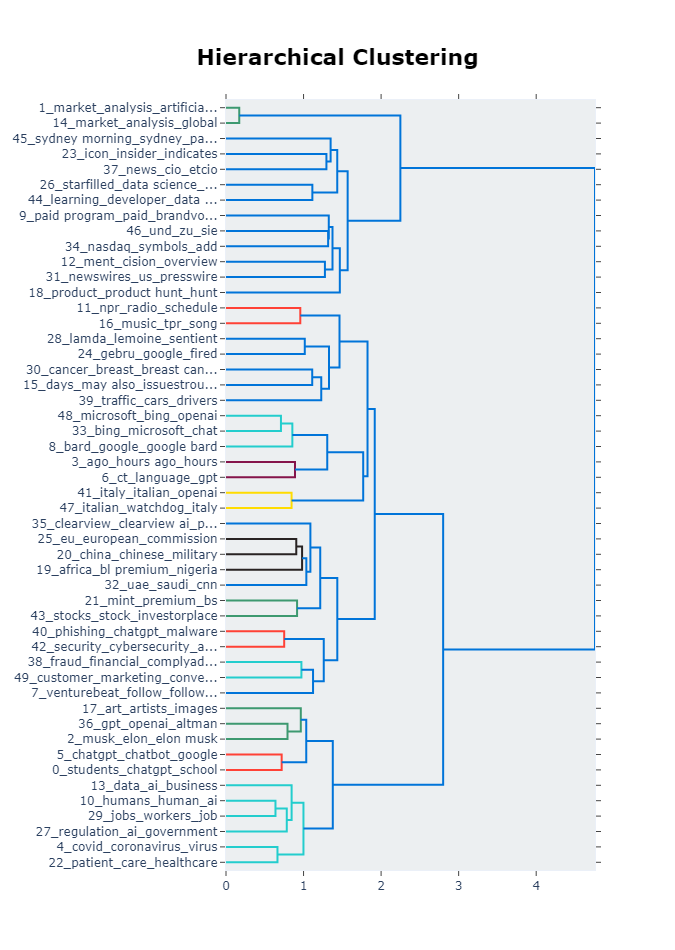

In [22]:
topic_model.visualize_hierarchy(top_n_topics=50)


In [23]:
#cant visualize topic probability distribution because probabilities not calculated for too many documents
# %%time
# # 
# topic_model.visualize_distribution(probs[100], min_probability=0.001)

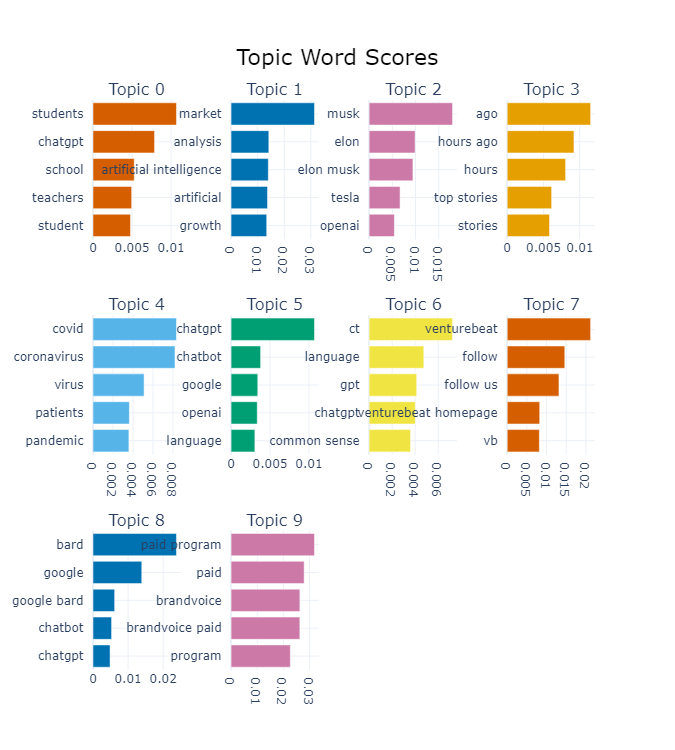

In [24]:
topic_model.visualize_barchart(top_n_topics=10)

In [8]:
path_lda = '/home/jupyter'


In [27]:
# Save model - 324 topics
topic_model.save(path_lda +'/lda_model_negative_324')

# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [35]:
saved_model = BERTopic.load(path_lda +'/lda_model_negative_324')

#### topic reduction to 200 topics

In [ ]:
%%time
new_topics = topic_model.reduce_topics(docs, nr_topics=200)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-19 21:34:06,358 - BERTopic - Reduced number of topics from 324 to 200


CPU times: user 3min 59s, sys: 5.56 s, total: 4min 5s
Wall time: 3min 59s


In [ ]:
freq = new_topics.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#xx topics found

Topics found: 200


,Topic,Count,Name
0,-1,15419,-1_ai_news_new_us
1,0,1652,0_market_analysis_global_report
2,1,1329,1_chatgpt_openai_gpt_language
3,2,971,2_bing_microsoft_bard_google
4,3,784,3_students_chatgpt_writing_school
5,4,758,4_ago_hours ago_hours_top stories
6,5,621,5_stocks_stock_investment_trading
7,6,608,6_google_gebru_lamda_lemoine
8,7,606,7_health_medical_patient_patients
9,8,597,8_schedule_npr_radio_wfmz


In [ ]:
new_topics.get_topic(0)

[('market', 0.02908676125354408),
 ('analysis', 0.012906196079722694),
 ('global', 0.011585196166690489),
 ('report', 0.011469206613984956),
 ('growth', 0.011046580561784189),
 ('artificial intelligence', 0.010844246205423774),
 ('artificial', 0.010716872417012307),
 ('intelligence', 0.010650100770378045),
 ('players', 0.00818906545431726),
 ('key', 0.008179032817210568)]

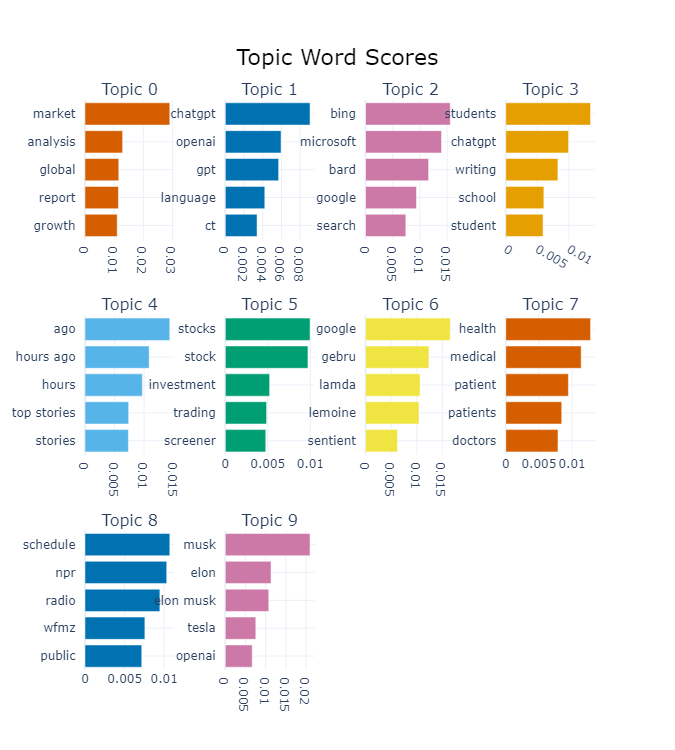

In [ ]:
new_topics.visualize_barchart(top_n_topics=10)

CPU times: user 5min 31s, sys: 25.9 s, total: 5min 57s
Wall time: 5min 56s


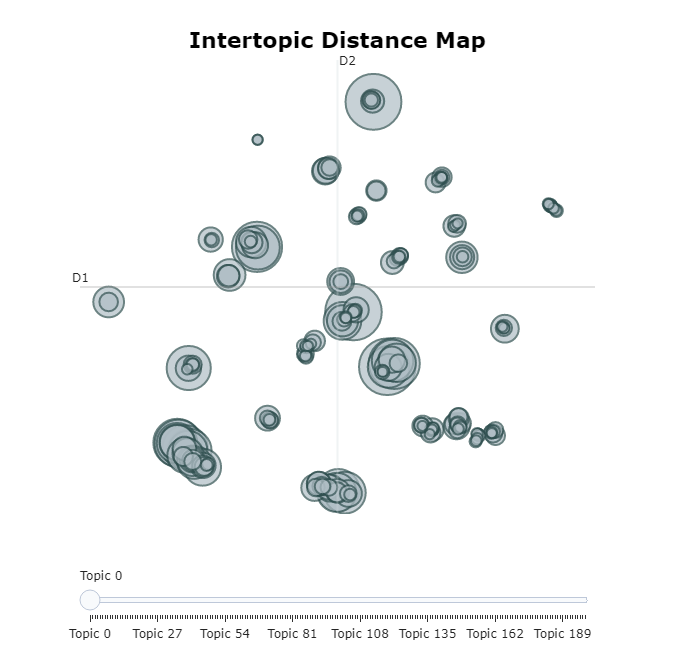

In [ ]:
%%time

new_topics.visualize_topics()
#

# Decided on 60 topics by counting 60 clusters from the vizualization above


In [28]:
df_negative.shape

(46684, 5)

In [36]:
%%time
new_topics_negative_50 = saved_model.reduce_topics(docs, nr_topics=60)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


CPU times: user 3min 41s, sys: 4.21 s, total: 3min 45s
Wall time: 3min 42s


In [89]:
freq = saved_model.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(60)
#xx topics found
#which topics interest me?
#topic 2 (chatgpt/students), topic 3 (china), topic 4 (health / medical), topic 5 (cybersecurity), 
#topic 6 (clearview, haeleon, human intelligence)
#topic 7 (elon musk ai) 
#topic 9 (ford driving automotive ai)
#topic 10 (eu rules ai)
#topic 14 (soundhound whisper ai)
#topic 16 (climate change)
#topic 18 (airlines)
#topic 20 (insurance)
#topic 23 (patent inventor drug law)
#topic 27 (agriculture ai)
#topic 40 (biometrics)
#topic 41 (oil gas)
#topic 43 bill gates
#topic 46 iot intelligence
#topic 25 (shipping vessels - forced labor)

Topics found: 60


,Topic,Count,Name
0,-1,15419,-1_ai_news_new_us
1,0,10049,0_news_ai_us_new
2,1,5610,1_market_ai_best_data
3,2,2761,2_ai_new_said_chatgpt
4,3,1810,3_china_news_ai_world
5,4,1596,4_health_medical_patients_news
6,5,1041,5_security_cyber_ai_darktrace
7,6,902,6_ai_haleon_clearview_human
8,7,685,7_musk_elon_elon musk_ai
9,8,652,8_news_colorado_weather_said


In [83]:
topic_model.get_topic(0)

[('news', 0.007405252543827842),
 ('ai', 0.006092027846908927),
 ('us', 0.0057810019052370164),
 ('new', 0.0056724081659317105),
 ('chatgpt', 0.005374548836430041),
 ('ago', 0.004972084758483603),
 ('google', 0.004693466862616686),
 ('said', 0.004332600604626917),
 ('search', 0.004179541590090548),
 ('technology', 0.00370243116406432)]

In [84]:
topic_model.get_topic(1)

[('market', 0.017221707394202333),
 ('ai', 0.009082598465034522),
 ('best', 0.009024070405494381),
 ('data', 0.008318310469694291),
 ('intelligence', 0.007828308756953088),
 ('artificial', 0.007441900313400519),
 ('artificial intelligence', 0.0074050821106429205),
 ('global', 0.006650609096339071),
 ('analysis', 0.006522860125863412),
 ('report', 0.006220708283179296)]

In [85]:
topic_model.get_topic(2)

[('ai', 0.008819494443238856),
 ('new', 0.0055501189202276984),
 ('said', 0.005522715015329383),
 ('chatgpt', 0.005336119976508489),
 ('students', 0.0053012652306209905),
 ('news', 0.005264595651365262),
 ('use', 0.005091125686074336),
 ('technology', 0.005020586521212914),
 ('rights', 0.004315063316597028),
 ('us', 0.004036904112252999)]

In [86]:
topic_model.get_topic(3)

[('china', 0.007562316080931663),
 ('news', 0.007174628153333819),
 ('ai', 0.006502221736585907),
 ('world', 0.006089358346871854),
 ('us', 0.005520043142706753),
 ('said', 0.004678549538788894),
 ('africa', 0.004590238526296292),
 ('technology', 0.004411636814258733),
 ('business', 0.004331079604250628),
 ('new', 0.004252086956044395)]

In [137]:
topic_model.get_topic(51)

[('edt', 0.11181561684224088),
 ('pm', 0.11001760482621853),
 ('est', 0.09340991815208681),
 ('pm edt', 0.07947858509232669),
 ('pm est', 0.07197361023204527),
 ('mar', 0.03136966677289483),
 ('jan', 0.030996411858508773),
 ('jan pm', 0.027564418450770324),
 ('mar pm', 0.025101145676307435),
 ('may pm', 0.02489490483529554)]

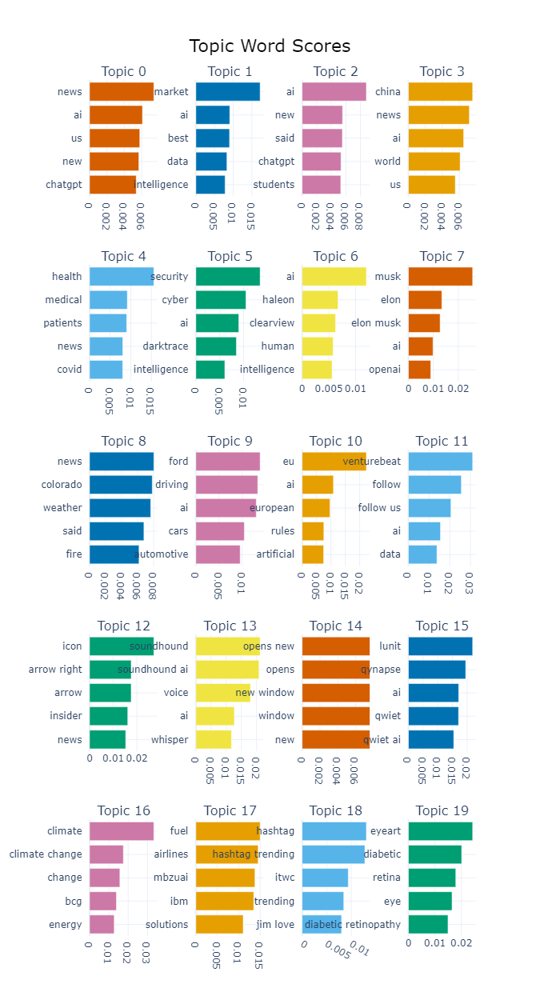

In [90]:
topic_model.visualize_barchart(top_n_topics=20)

#### topic reduction (removal of outliers)

In [40]:
topic_model = new_topics_negative_50

In [41]:
topic_frequencies = pd.DataFrame(topic_model.get_topic_info())


In [42]:
topic_frequencies.shape

(60, 3)

In [43]:
topic_frequencies.head(5)

,Topic,Count,Name
0,-1,15419,-1_ai_news_new_us
1,0,10049,0_news_ai_us_new
2,1,5610,1_market_ai_best_data
3,2,2761,2_ai_new_said_chatgpt
4,3,1810,3_china_news_ai_world


In [44]:
# Remove the topic with a topic value of -1
topic_frequencies = topic_frequencies[topic_frequencies['Topic'] != -1]

# Get the count of remaining articles in the topics
remaining_articles = topic_frequencies.shape[0]

# Print the number of remaining articles
print("Number of topics after removing the topic with value -1:", remaining_articles)

# Calculate the sum of the "Count" column
remaining_articles = topic_frequencies['Count'].sum()

# Print the number of remaining articles
print("Number of remaining articles in the topics:", remaining_articles)


Number of topics after removing the topic with value -1: 59
Number of remaining articles in the topics: 31265


In [45]:
topic_frequencies.head()

,Topic,Count,Name
1,0,10049,0_news_ai_us_new
2,1,5610,1_market_ai_best_data
3,2,2761,2_ai_new_said_chatgpt
4,3,1810,3_china_news_ai_world
5,4,1596,4_health_medical_patients_news


In [46]:
df_topics_negative = topic_model.get_document_info(docs)


In [47]:
#removing outliers
df_topics_negative = df_topics_negative[df_topics_negative['Topic'] != -1]


In [62]:
#add date to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, df_negative[["cleaned_text", "date"]], left_on="Document", right_on="cleaned_text", how="inner")
df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [102]:
#add url to the negative topics dataframe

df_topics_negative = pd.merge(df_topics_negative, df_negative[["cleaned_text", "url"]], left_on="Document", right_on="cleaned_text", how="inner")
df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [107]:
#add spacy text (not lower cased and unclean) to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, spacy_content_df[["content_clean", "url"]], left_on="url", right_on="url", how="inner")
#df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [112]:
#add title (cleaned) to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, df_negative[["clean_title", "cleaned_text"]], left_on="Document", right_on="cleaned_text", how="inner")
df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [120]:
#add spacy title (not lower cased and unclean) to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, spacy_content_df[["title", "url"]], left_on="url", right_on="url", how="inner")
#df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [121]:
df_topics_negative.shape
#the merges must have messed up a little bit - shape is different from before adding all the columns

(36234, 11)

In [123]:
# spacy_content_df = pd.read_parquet('content_clean_spacy_final_project.parquet', engine='pyarrow')
# spacy_content_df.head(1)

#### Looking at representative documents

In [124]:
df_topics_negative["Representative_document"].value_counts()
#after removing -1 (outliers)

False    35996
True       238
Name: Representative_document, dtype: int64

In [125]:
filtered_df = df_topics_negative[df_topics_negative["Representative_document"] == True]
filtered_df.shape

(238, 11)

In [199]:
#filtered_df.head(1)

In [128]:
#PARQUET SAVE
df_topics_negative.to_parquet('df_topics_negative_60.parquet', engine='pyarrow')

# Checkpoint: Read Parquet File

In [122]:
df_topics_negative = pd.read_parquet('df_topics_negative_60.parquet', engine='pyarrow')
#df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')


# Sentiment Analysis on targetted topics within the 60 negative topics 

#### topic search - Chat GPT

In [129]:
similar_topics, similarity = topic_model.find_topics("chat gpt", top_n=5); similar_topics

[2, 45, 0, 51, 15]

In [130]:
similar_topics, similarity = topic_model.find_topics("chatgpt", top_n=5); similar_topics

[0, 2, 45, 15, -1]

In [131]:
similar_topics, similarity = topic_model.find_topics("gpt", top_n=5); similar_topics

[15, 51, 45, 2, 18]

#### the above suggest that ChatGPT is most represented by topic 2 in negative topics

#### lets take a look at the number of articles over time in 2 topic 2 as a result

In [201]:
selected_topics = [2]
chatgpt_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [143]:
chatgpt_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3209 entries, 2 to 36233
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Document                 3209 non-null   object 
 1   Topic                    3209 non-null   int64  
 2   Name                     3209 non-null   object 
 3   Top_n_words              3209 non-null   object 
 4   Probability              3209 non-null   float64
 5   Representative_document  3209 non-null   bool   
 6   date                     3209 non-null   object 
 7   url                      3209 non-null   object 
 8   content_clean            3209 non-null   object 
 9   clean_title_x            3209 non-null   object 
 10  title                    3209 non-null   object 
dtypes: bool(1), float64(1), int64(1), object(8)
memory usage: 278.9+ KB


In [202]:
chatgpt_filtered = chatgpt_df[chatgpt_df['Probability'] > 0.99]

# Count the number of rows satisfying the condition
count = chatgpt_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

1326

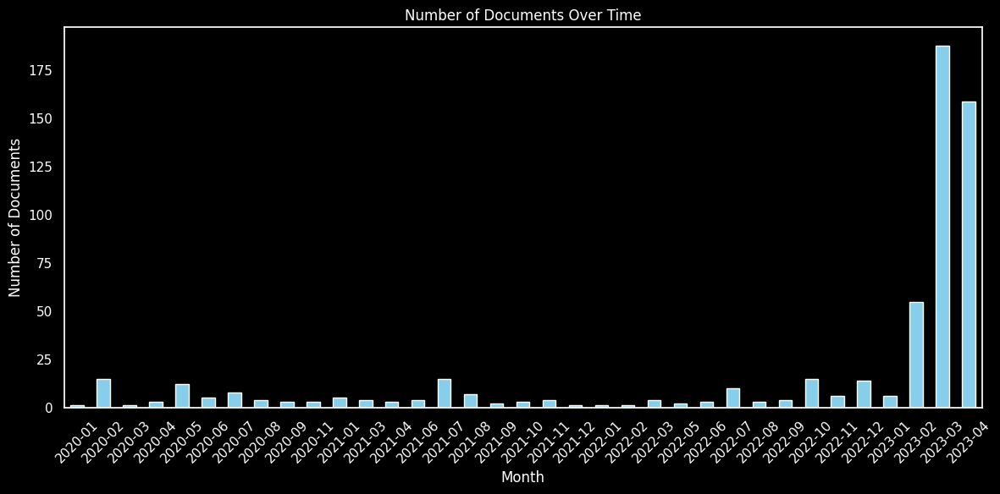

In [203]:
import matplotlib.pyplot as plt

elon_df['date'] = pd.to_datetime(elon_df['date'])

# Extract the month and year from the 'date' column
elon_df['month_year'] = elon_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = elon_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


#### extract entities from this chatgpt df

In [84]:
#!pip install spacy

In [157]:
#!python -m spacy download en_core_web_sm


In [208]:
#!python -m spacy download en_core_web_trf

In [215]:
#!python -m spacy download en_core_web_lg


In [2]:
import spacy 
from spacy import displacy
from spacy.util import minibatch, compounding
from tqdm import tqdm
spacy.prefer_gpu()
#spacy.require_gpu()

print(spacy.__version__)


3.5.3


In [211]:
#!pip install spacy-transformers

In [7]:
# nlp = spacy.load("en_core_web_sm",exclude=['tok2vec','lemmatizer'])
nlp = spacy.load("en_core_web_lg",exclude=['tok2vec','lemmatizer'])


In [125]:
df_analysis_sample = chatgpt_filtered

In [127]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 773 ms, sys: 13.1 s, total: 13.8 s
Wall time: 1min 5s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [128]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


In [129]:
top_org_entities.head(5)
#using large spacy

year,2020,2021,2022,2023
AI,631.0,1134.0,541.0,1027.0
Facebook,246.0,161.0,48.0,48.0
Google,197.0,68.0,70.0,195.0
Yahoo Japan,166.0,0.0,0.0,0.0
White House,79.0,246.0,109.0,113.0


In [132]:
df = top_org_entities

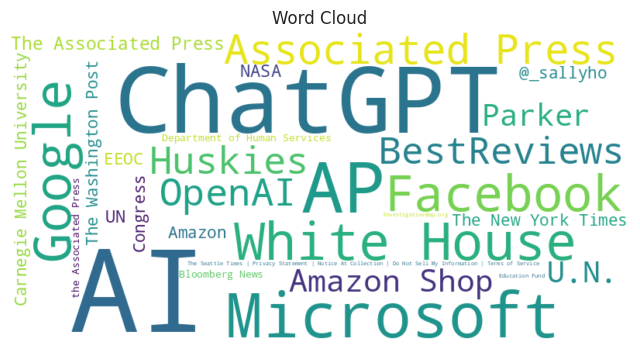

In [133]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


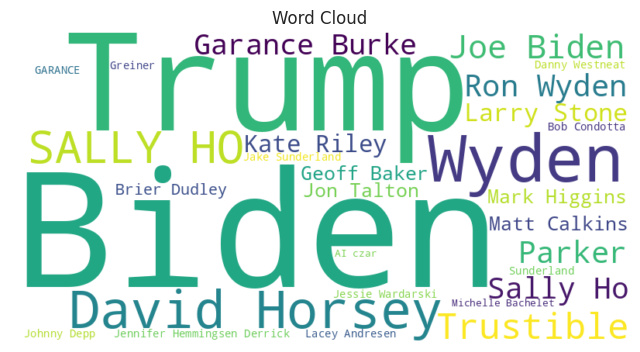

In [136]:
#this is important because of the people that are talking negatively
#about ChatGPT
#very regulation related
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


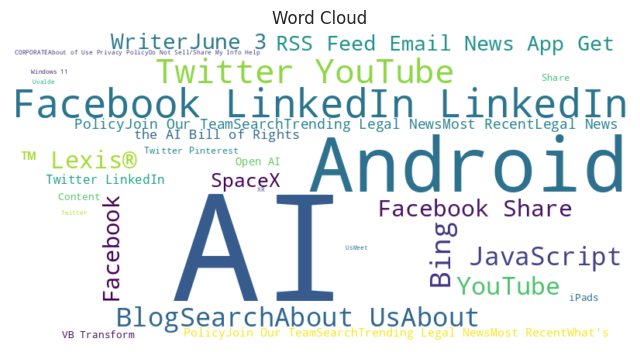

In [135]:
#not great results
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic search - topic 7 - Elon Musk

In [203]:
#which topics interest me?
#topic 2 (chatgpt/students), topic 3 (china), topic 4 (health / medical), topic 5 (cybersecurity), 
#topic 6 (clearview, haeleon, human intelligence)
#topic 7 (elon musk ai) 
#topic 9 (ford driving automotive ai)
#topic 10 (eu rules ai)
#topic 16 (climate change)
#topic 20 (insurance)
#topic 23 (patent inventor drug law)
#topic 27 (agriculture ai)
#topic 40 (biometrics)
#topic 41 (oil gas)
#topic 43 bill gates
#topic 46 iot intelligence
#topic 25 (shipping vessels - forced labor)

In [204]:
topic_model.get_topic(7)
#Musk

[('musk', 0.02573649391349288),
 ('elon', 0.0134040512576289),
 ('elon musk', 0.012704228755071207),
 ('ai', 0.009853280837789283),
 ('openai', 0.008939002985551463),
 ('tesla', 0.008835822618572166),
 ('news', 0.007703908803972084),
 ('letter', 0.007393194494888328),
 ('tire', 0.006570655625396093),
 ('lisk machine', 0.006139779272358006)]

In [197]:
selected_topics = [7]
elon_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [198]:
elon_df.shape

(669, 11)

In [199]:
elon_df = elon_df[elon_df['Probability'] > 0.99]

# Count the number of rows satisfying the condition
count = elon_df.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

574

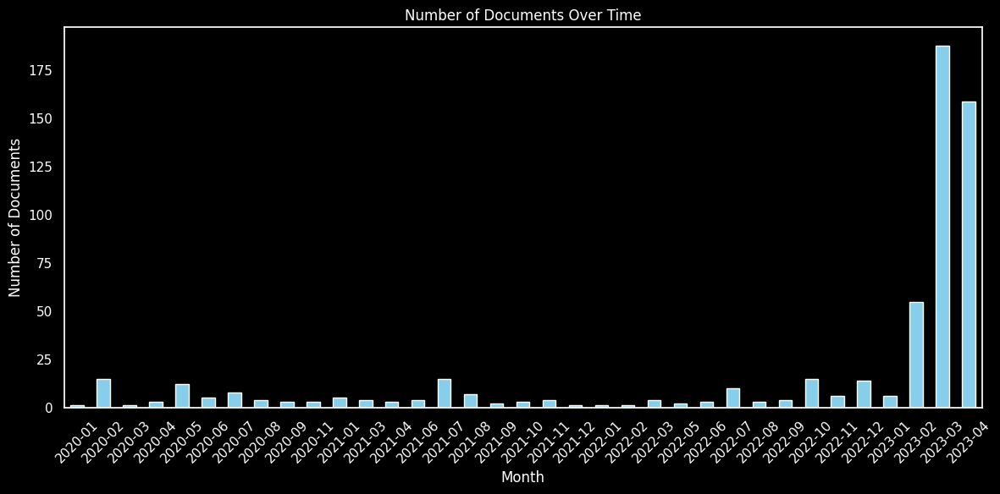

In [200]:
import matplotlib.pyplot as plt

elon_df['date'] = pd.to_datetime(elon_df['date'])

# Extract the month and year from the 'date' column
elon_df['month_year'] = elon_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = elon_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [142]:
df_analysis_sample = elon_df

In [143]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 480 ms, sys: 12.6 s, total: 13.1 s
Wall time: 37 s


In [144]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


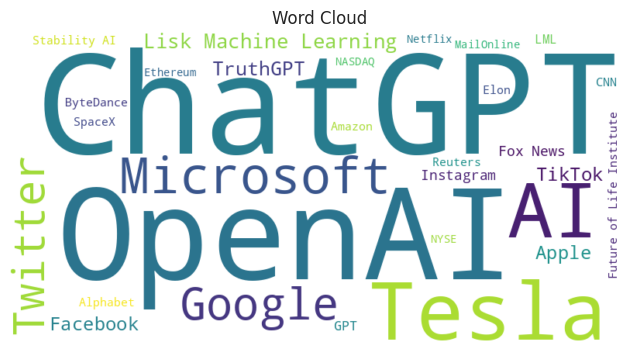

In [145]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


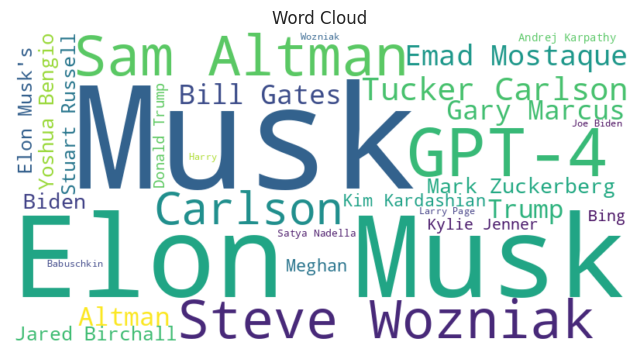

In [146]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


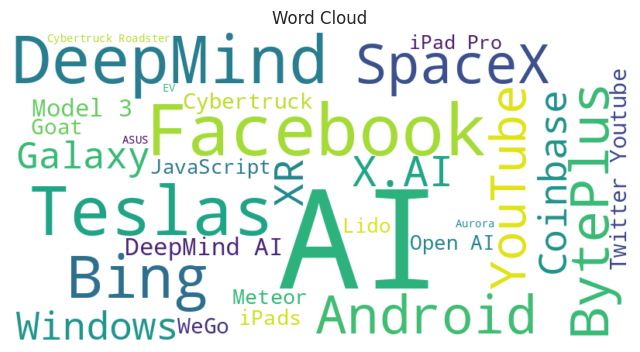

In [147]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### Analysis on Elon_df - negative articles on chatgpt (look at the articles)

In [168]:
elon_df_true = elon_df[elon_df['Representative_document'] == True]
#elon_df_true.head(2)

In [151]:
elon_df_true.shape

(3, 15)

#### topic search - topic 9 - Automotive

In [249]:
topic_model.get_topic(9)
#Ford / Driving / Automotive / Automonous

[('ford', 0.013866570543822102),
 ('driving', 0.01335653672093919),
 ('ai', 0.013033024667231953),
 ('cars', 0.010459531417790963),
 ('automotive', 0.009561054481019453),
 ('self driving', 0.008487544306452165),
 ('autonomous', 0.008208834846204507),
 ('vehicles', 0.007839642453602849),
 ('self', 0.007411258706136407),
 ('argo', 0.007245306012230565)]

In [192]:
selected_topics = [9]
auto_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [193]:
auto_df.shape

(558, 11)

In [194]:
auto_df_filtered = auto_df[auto_df['Probability'] > 0.9]

# Count the number of rows satisfying the condition
count = auto_df_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

281

/var/tmp/ipykernel_5904/2574576459.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  auto_df_filtered['date'] = pd.to_datetime(auto_df_filtered['date'])
/var/tmp/ipykernel_5904/2574576459.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  auto_df_filtered['month_year'] = auto_df_filtered['date'].dt.to_period('M')


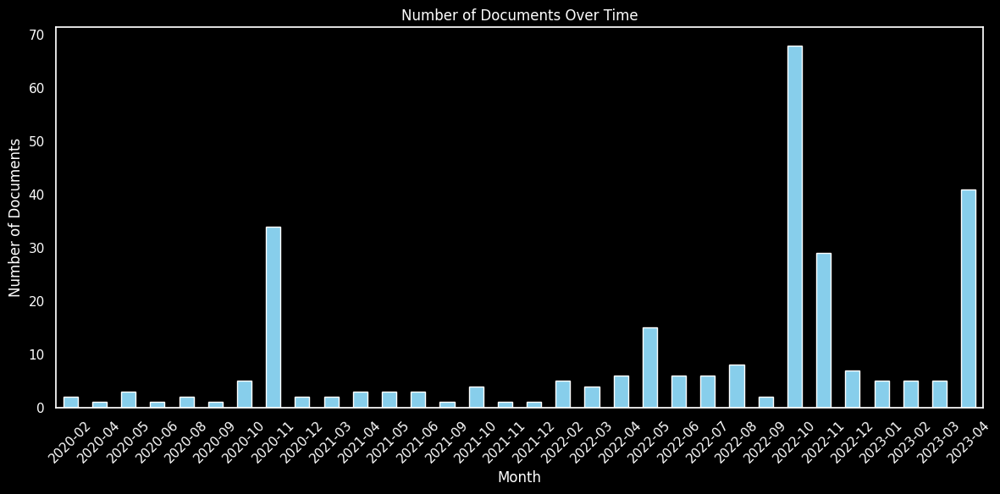

In [196]:
import matplotlib.pyplot as plt

auto_df_filtered['date'] = pd.to_datetime(auto_df_filtered['date'])

# Extract the month and year from the 'date' column
auto_df_filtered['month_year'] = auto_df_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = auto_df_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [155]:
df_analysis_sample = auto_df_filtered

In [156]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 393 ms, sys: 13.2 s, total: 13.6 s
Wall time: 31 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [157]:
# Example: Accessing the top entities for 'ORG'
top_org_entities_auto_title = df_entities_by_label['ORG']
top_person_entities_auto_title = df_entities_by_label['PERSON']
top_product_entities_auto_title = df_entities_by_label['PRODUCT']


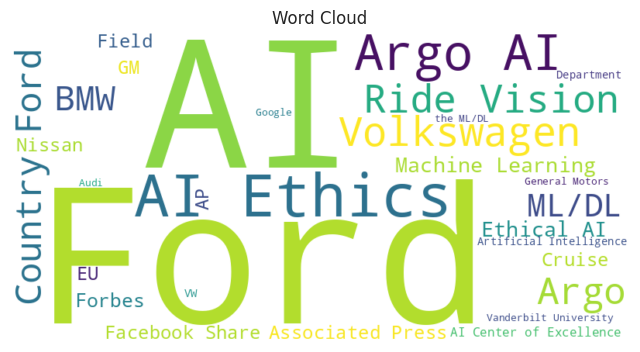

In [158]:
df = top_org_entities_auto_title
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


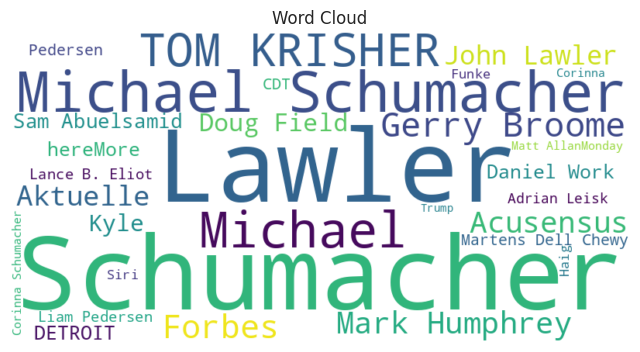

In [159]:
df = top_person_entities_auto_title
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


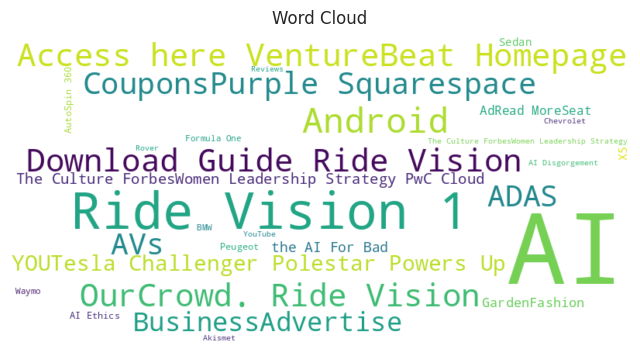

In [160]:
df = top_product_entities_auto_title
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [164]:
top_product_entities_auto_title.head(5)

year,2020,2021,2022,2023,total
Ride Vision 1,96.0,0.0,0.0,0.0,96.0
AI,42.0,55.0,2501.0,94.0,2692.0
Access here VentureBeat Homepage,32.0,0.0,0.0,0.0,32.0
OurCrowd. Ride Vision,32.0,0.0,0.0,0.0,32.0
Download Guide Ride Vision,32.0,0.0,0.0,0.0,32.0


In [166]:
auto_df_filtered = auto_df_filtered[auto_df_filtered['Representative_document'] == True]
#auto_df_filtered.head(2)

#### topic search - topic 10 (eu rules ai)


In [170]:
selected_topics = [10]
eu_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [171]:
eu_df.shape

(463, 11)

In [178]:
eu_df_filtered = eu_df[eu_df['Probability'] > 0.005]

# Count the number of rows satisfying the condition
count = eu_df_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

432

/var/tmp/ipykernel_5904/239987131.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eu_df_filtered['date'] = pd.to_datetime(eu_df_filtered['date'])
/var/tmp/ipykernel_5904/239987131.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eu_df_filtered['month_year'] = eu_df_filtered['date'].dt.to_period('M')


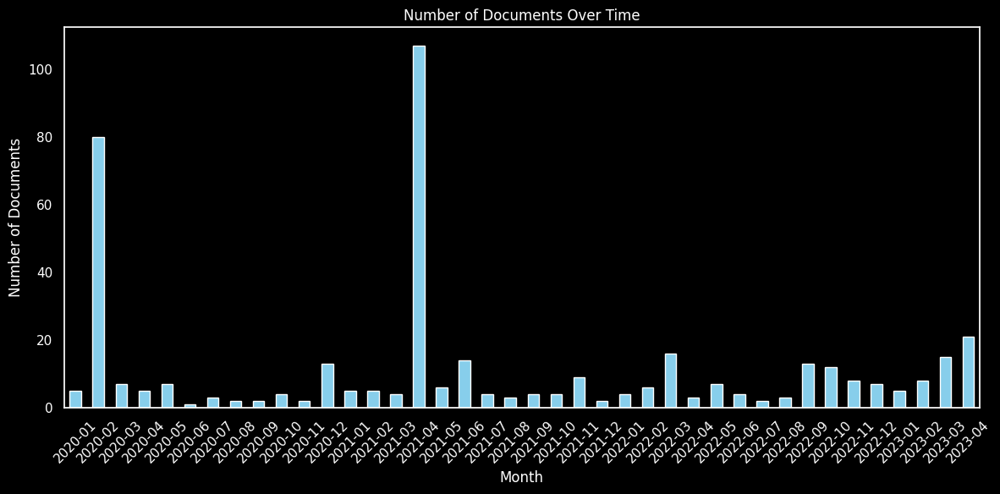

In [187]:
import matplotlib.pyplot as plt

eu_df_filtered['date'] = pd.to_datetime(eu_df_filtered['date'])

# Extract the month and year from the 'date' column
eu_df_filtered['month_year'] = eu_df_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = eu_df_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [205]:
#EU proposed ban to use of AI
eu_df_filtered_apr2021 = eu_df_filtered[eu_df_filtered['month_year'] == '2021-04']
#eu_df_filtered_apr2021.head(2)

In [208]:
#EU imposes sweeping regulations on facial recognition, Artificial Intelligence
eu_df_filtered_feb2020 = eu_df_filtered[eu_df_filtered['month_year'] == '2020-02']
#eu_df_filtered_feb2020.head(2)

In [210]:
df_analysis_sample = eu_df_filtered

In [211]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 466 ms, sys: 13.4 s, total: 13.9 s
Wall time: 28.9 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [212]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


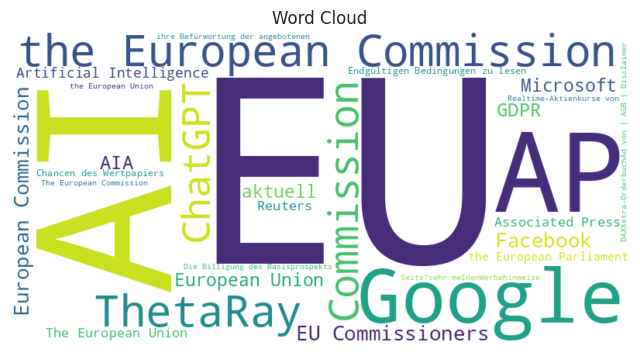

In [213]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


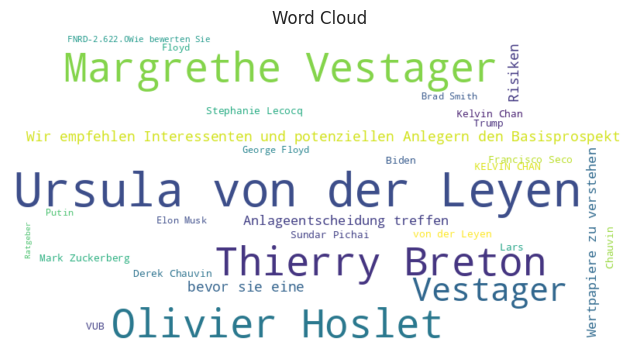

In [214]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


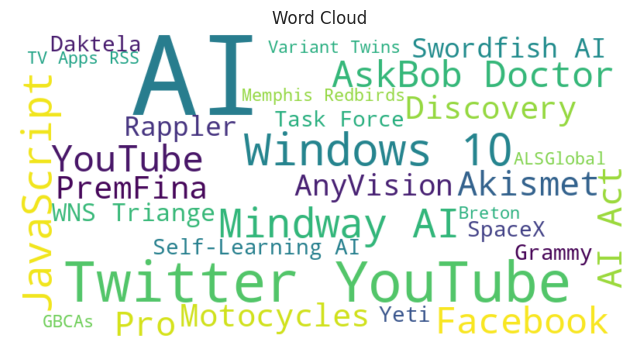

In [215]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [217]:
#same results from April 2021
eu_df_true = eu_df[eu_df['Representative_document'] == True]
#eu_df_true.head(2)

#### topic 16 - climate change

In [219]:
selected_topics = [16]
climate_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [220]:
climate_df.shape

(251, 11)

In [223]:
climate_df_filtered = climate_df[climate_df['Probability'] > 0.5]

# Count the number of rows satisfying the condition
count = climate_df_filtered.shape[0]
count



230

/var/tmp/ipykernel_5904/2911246788.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  climate_df_filtered['date'] = pd.to_datetime(climate_df_filtered['date'])
/var/tmp/ipykernel_5904/2911246788.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  climate_df_filtered['month_year'] = climate_df_filtered['date'].dt.to_period('M')


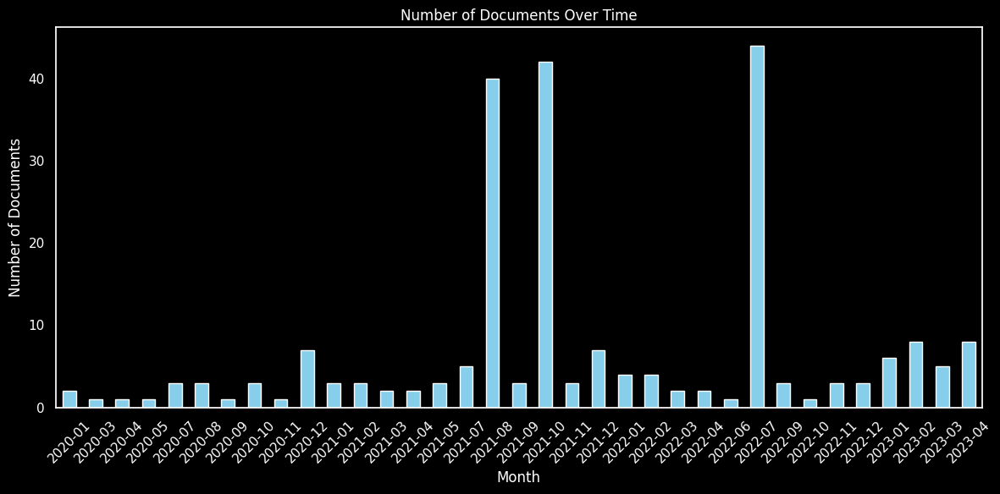

In [225]:
import matplotlib.pyplot as plt

climate_df_filtered['date'] = pd.to_datetime(climate_df_filtered['date'])

# Extract the month and year from the 'date' column
climate_df_filtered['month_year'] = climate_df_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = climate_df_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [228]:
#this is not a trend - this is just the same article again and again
climate_df_filtered_aug2021 = climate_df_filtered[climate_df_filtered['month_year'] == '2021-08']
# climate_df_filtered_aug2021.head(10)

In [230]:
climate_df_filtered_aug2021.shape

(42, 12)

In [232]:
#this article is showing up in different websites - why? read description below
climate_df_filtered_oct2021 = climate_df_filtered[climate_df_filtered['month_year'] == '2021-10']
# climate_df_filtered_oct2021.head(10)
'''This Climate Does Not Exist invites users to project themselves into environments transformed by climate change. What would a place look like if it was hit by flooding, wildfires or smog? Using a complex algorithm, the site generates a realistic filter of the effects of climate change on any location in Google Street View.

"If nothing is done soon, we can expect major climate disturbances," says Yoshua Bengio, Mila's scientific director. "By showing images of how climate change could affect the places we hold dear, this website makes the risks of climate change that much more real and personal. We hope this will motivate people to take action to prevent the worst-case scenarios from coming true."

The site uses a class of algorithms called generative adversarial networks, or GANs. Originally designed by researchers at Mila, GANs are now being used widely to generate highly realistic images. In this way, artificial intelligence is being harnessed in the global fight against climate change.
'''

'This Climate Does Not Exist invites users to project themselves into environments transformed by climate change. What would a place look like if it was hit by flooding, wildfires or smog? Using a complex algorithm, the site generates a realistic filter of the effects of climate change on any location in Google Street View.\n\n"If nothing is done soon, we can expect major climate disturbances," says Yoshua Bengio, Mila\'s scientific director. "By showing images of how climate change could affect the places we hold dear, this website makes the risks of climate change that much more real and personal. We hope this will motivate people to take action to prevent the worst-case scenarios from coming true."\n\nThe site uses a class of algorithms called generative adversarial networks, or GANs. Originally designed by researchers at Mila, GANs are now being used widely to generate highly realistic images. In this way, artificial intelligence is being harnessed in the global fight against clima

In [234]:
#87% of Climate and AI Leaders Believe That AI Is Critical in the Fight Against Climate Change	
climate_df_filtered_jul2022 = climate_df_filtered[climate_df_filtered['month_year'] == '2022-07']
#climate_df_filtered_jul2022.head(10)
'''New Report from AI for the Planet Alliance, BCG, and BCG GAMMA Reveals a Strong Appetite for Using AI to Tackle Climate Change, but Organizations Face Obstacles to Achieving Impact at Scale
'''
'''According to a new report from the AI for the Planet Alliance, produced in collaboration with Boston Consulting Group (BCG) and BCG GAMMA, 87% of public- and private-sector leaders who oversee climate and AI topics believe that AI is a valuable asset in the fight against climate change. The report, titled How AI Can Be a Powerful Tool in the Fight Against Climate Change, is being released today.

Based on survey results from over 1,000 executives with decision-making authority on AI or climate-change initiatives, the report finds that roughly 40% of organizations can envision using AI for their own climate efforts (see the exhibit). However, even among these experts, there is widespread agreement that significant barriers to broad adoption remain in place: 78% of respondents cite insufficient AI expertise as an obstacle to using AI in their climate change efforts, 77% cite limited availability of AI solutions as a roadblock, and 67% point to a lack of confidence in AI-related data and analysis.

'''

'According to a new report from the AI for the Planet Alliance, produced in collaboration with Boston Consulting Group (BCG) and BCG GAMMA, 87% of public- and private-sector leaders who oversee climate and AI topics believe that AI is a valuable asset in the fight against climate change. The report, titled How AI Can Be a Powerful Tool in the Fight Against Climate Change, is being released today.\n\nBased on survey results from over 1,000 executives with decision-making authority on AI or climate-change initiatives, the report finds that roughly 40% of organizations can envision using AI for their own climate efforts (see the exhibit). However, even among these experts, there is widespread agreement that significant barriers to broad adoption remain in place: 78% of respondents cite insufficient AI expertise as an obstacle to using AI in their climate change efforts, 77% cite limited availability of AI solutions as a roadblock, and 67% point to a lack of confidence in AI-related data a

#### topic topic 17 (airlines)

In [241]:
selected_topics = [17]
airlines_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [242]:
airlines_df.shape

(207, 11)

/var/tmp/ipykernel_5904/2713302415.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airlines_df['date'] = pd.to_datetime(airlines_df['date'])
/var/tmp/ipykernel_5904/2713302415.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airlines_df['month_year'] = airlines_df['date'].dt.to_period('M')


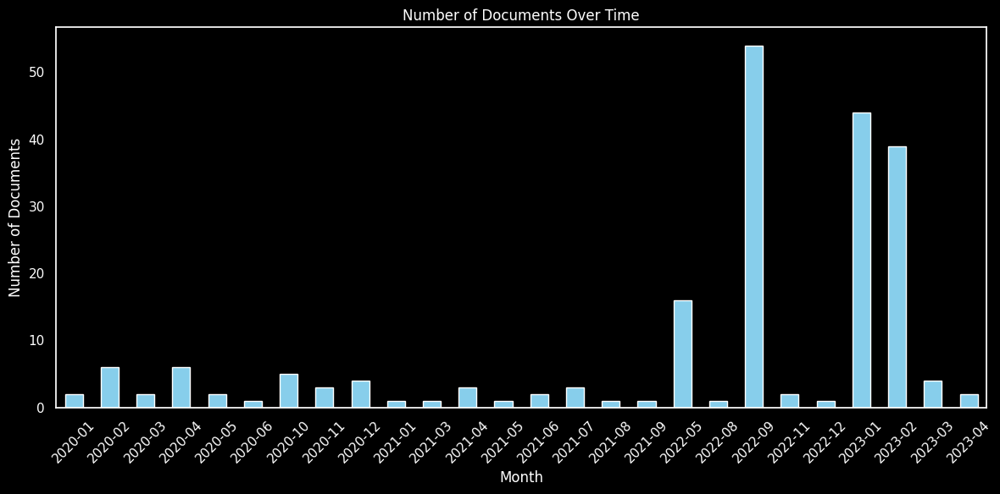

In [243]:
import matplotlib.pyplot as plt

airlines_df['date'] = pd.to_datetime(airlines_df['date'])

# Extract the month and year from the 'date' column
airlines_df['month_year'] = airlines_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = airlines_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [246]:
airlines_df_feb2023 = airlines_df[airlines_df['month_year'] == '2023-02']
#airlines_df_feb2023.head(10)
'''Atlas AI, a leading provider of geospatial intelligence products informing investment in sustainable and inclusive growth, announces the public release of its Atlas of Human Settlements (AHS) 2021 data layers for Turkey and Syria in response to the recent earthquake. The AHS data offers crucial intelligence for crisis management bodies in their immediate efforts to respond to the disaster, as well as to help inform the most sustainable approach to long-term rebuilding efforts.'''

'Atlas AI, a leading provider of geospatial intelligence products informing investment in sustainable and inclusive growth, announces the public release of its Atlas of Human Settlements (AHS) 2021 data layers for Turkey and Syria in response to the recent earthquake. The AHS data offers crucial intelligence for crisis management bodies in their immediate efforts to respond to the disaster, as well as to help inform the most sustainable approach to long-term rebuilding efforts.'

In [248]:
'''Available on Google Cloud's Analytics Hub and powered by BigQuery, the AHS provides a comprehensive and up-to-date view of human settlements around the world, delivering precise information on the evolving footprint and density of human activity through the application of artificial intelligence (AI) to satellite imagery.

"Analysis of the built environment assets affected by a natural disaster can help guide search and rescue efforts, improve distribution of humanitarian aid, and prioritize mid- and long term reconstruction and investment planning," said Abe Tarapani, CEO of Atlas AI. "We're proud to make the Atlas of Human Settlements dataset covering Turkey and Syria freely available to government and humanitarian agencies supporting the response to this tragic crisis, and we are committed to continuing to enhance this product in the days and weeks to come as needs emerge."

With the outdated information offered by the best alternative source, the Global Human Settlement Layer (GHSL) from 2018, the AHS layers offer the most up-to-date pre-crisis data from 2021, are of superior quality, and are delivered with annual updates at a spatial resolution of 10 meters.  The package includes three data products, including a built-up surface map, built-up index map, and settlement map.  The AHS product is explicitly designed to help response agencies answer questions such as:
'''

'Available on Google Cloud\'s Analytics Hub and powered by BigQuery, the AHS provides a comprehensive and up-to-date view of human settlements around the world, delivering precise information on the evolving footprint and density of human activity through the application of artificial intelligence (AI) to satellite imagery.\n\n"Analysis of the built environment assets affected by a natural disaster can help guide search and rescue efforts, improve distribution of humanitarian aid, and prioritize mid- and long term reconstruction and investment planning," said Abe Tarapani, CEO of Atlas AI. "We\'re proud to make the Atlas of Human Settlements dataset covering Turkey and Syria freely available to government and humanitarian agencies supporting the response to this tragic crisis, and we are committed to continuing to enhance this product in the days and weeks to come as needs emerge."\n\nWith the outdated information offered by the best alternative source, the Global Human Settlement Laye

In [251]:
airlines_df_sept2022 = airlines_df[airlines_df['month_year'] == '2022-09']
#airlines_df_sept2022.head(10)


In [250]:
'''LONDON, Sept. 22, 2022 /PRNewswire/ -- In the face of an imminent air transport crisis, digital technologies have provided a new ramble into what aviation experts have described as sustainable and profitable ways to address the mounting environmental pressures and optimize efficiency. Of critical importance, Big Data and Artificial Intelligence (AI) represent two technological levers that airline companies will require to meet their carbon footprint targets and increase fuel efficiency.

'''

'LONDON, Sept. 22, 2022 /PRNewswire/ -- In the face of an imminent air transport crisis, digital technologies have provided a new ramble into what aviation experts have described as sustainable and profitable ways to address the mounting environmental pressures and optimize efficiency. Of critical importance, Big Data and Artificial Intelligence (AI) represent two technological levers that airline companies will require to meet their carbon footprint targets and increase fuel efficiency.\n\n'

In [252]:
#https://www.walb.com/prnewswire/2022/09/22/chairman-board-avia-solutions-group-gediminas-ziemelis-with-30-airlines-costs-accounting-jet-fuel-fuel-price-spikes-pose-risk-crisis-aviation-big-data-ai-could-help-reduce-consumption-co2-emissions-by-2-5/
'''Numerous reports have revealed that aviation accounts for more than 3% of global carbon emissions. Besides, air transport represents over 12% of the total emissions from transport-related activities. With the anticipated growth in air traffic, the general expectation is that the aviation industry will report a manifold increase in carbon footprint by 2050.

Like other transport sectors, aviation has also suffered from the adverse consequences of the intensifying economic pressure. The industry is grappling against unprecedented challenges that have pushed many airlines into a near crisis, putting them in the line of interrupted cash flows and reduced profitability. According to IATA, global airlines are now operating in a "bullish oil market," with fuel prices surpassing $80 per barrel. Inconceivably, such spikes in fuel price and curbed supplies represent a critical problem for airlines, given that jet fuel accounts for more than 30% of airline's costs.

Avia Solutions believe that Big Data and data science have provided new possibilities for airlines to accurately predict the amount of fuel needed for every scheduled flight and optimize flight routes to increase energy efficiency. The best scenario is to have a single analytical tool. Case in point, Southwest Airlines provides an excellent example of a carrier that has successfully invested in data analytics through its fuel consumption project.

'''

'Numerous reports have revealed that aviation accounts for more than 3% of global carbon emissions. Besides, air transport represents over 12% of the total emissions from transport-related activities. With the anticipated growth in air traffic, the general expectation is that the aviation industry will report a manifold increase in carbon footprint by 2050.\n\nLike other transport sectors, aviation has also suffered from the adverse consequences of the intensifying economic pressure. The industry is grappling against unprecedented challenges that have pushed many airlines into a near crisis, putting them in the line of interrupted cash flows and reduced profitability. According to IATA, global airlines are now operating in a "bullish oil market," with fuel prices surpassing $80 per barrel. Inconceivably, such spikes in fuel price and curbed supplies represent a critical problem for airlines, given that jet fuel accounts for more than 30% of airline\'s costs.\n\nAvia Solutions believe t

#### use this for climate

In [256]:
airlines_df_jan2023 = airlines_df[airlines_df['month_year'] == '2023-01']
#airlines_df_jan2023.head(10)
#this is more for climate change
#https://www.wifr.com/prnewswire/2023/01/19/ibm-mbzuai-advance-ai-climate-culture/	

In [257]:
'''ABU DHABI, UAE, Jan. 19, 2023 /PRNewswire/ -- Mohamed bin Zayed University of Artificial Intelligence (MBZUAI) in collaboration with IBM (NYSE: IBM) formally launched an AI Center of Excellence on Tuesday, January 17, as part of Abu Dhabi Sustainability Week's World Future Energy Summit. The Center aims to advance collaboration to improve the adoption of AI technology and help drive sustainability. The Center will develop carbon neutral solutions to existing energy supplies, combat climate change, and further natural language processing (NLP) for Arabic dialects.

'''

"ABU DHABI, UAE, Jan. 19, 2023 /PRNewswire/ -- Mohamed bin Zayed University of Artificial Intelligence (MBZUAI) in collaboration with IBM (NYSE: IBM) formally launched an AI Center of Excellence on Tuesday, January 17, as part of Abu Dhabi Sustainability Week's World Future Energy Summit. The Center aims to advance collaboration to improve the adoption of AI technology and help drive sustainability. The Center will develop carbon neutral solutions to existing energy supplies, combat climate change, and further natural language processing (NLP) for Arabic dialects.\n\n"

In [259]:
'''"IBM's collaboration with MBZUAI will leverage AI to address some of the most pressing issues of our time including sustainability and net zero strategies," said Arvind Krishna, IBM Chairman and CEO. "The new Center of Excellence will also develop local digital skills and attract leading researchers that will help deliver the UAE's National Artificial Intelligence Strategy 2031."

The deployment and use of clean energy solutions is one of the main pillars of the UAE's model of addressing the challenge of climate change and reducing GHG emissions, in line with UAE Net Zero 2050 strategic initiative. The AI Center of Excellence plans to leverage the talents of IBM researchers with expertise in data science, machine learning and NLP, in collaboration with MBZUAI faculty and students. The teams will work together towards the advancement of both fundamental and applied research objectives.

'''

'"IBM\'s collaboration with MBZUAI will leverage AI to address some of the most pressing issues of our time including sustainability and net zero strategies," said Arvind Krishna, IBM Chairman and CEO. "The new Center of Excellence will also develop local digital skills and attract leading researchers that will help deliver the UAE\'s National Artificial Intelligence Strategy 2031."\n\nThe deployment and use of clean energy solutions is one of the main pillars of the UAE\'s model of addressing the challenge of climate change and reducing GHG emissions, in line with UAE Net Zero 2050 strategic initiative. The AI Center of Excellence plans to leverage the talents of IBM researchers with expertise in data science, machine learning and NLP, in collaboration with MBZUAI faculty and students. The teams will work together towards the advancement of both fundamental and applied research objectives.\n\n'

In [260]:
df_analysis_sample = airlines_df

In [261]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 372 ms, sys: 13.3 s, total: 13.6 s
Wall time: 22.6 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [262]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


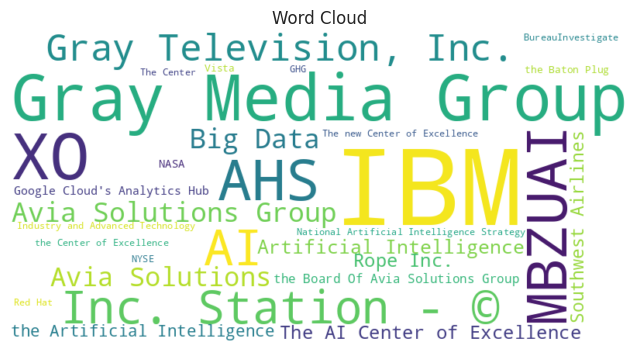

In [263]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


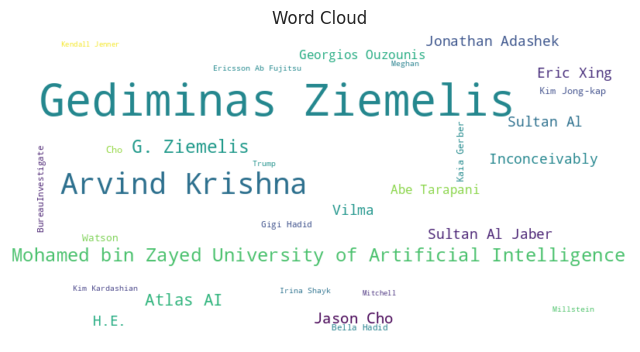

In [264]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


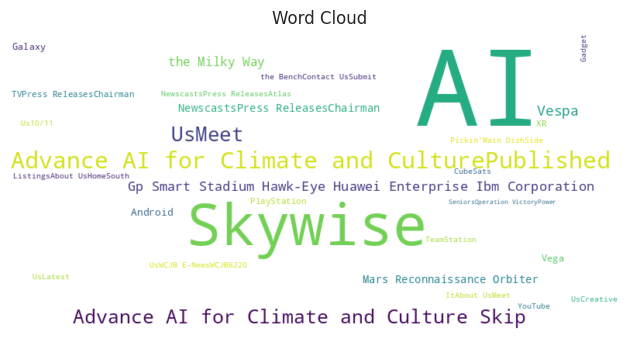

In [265]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 20 (insurance)

In [289]:
selected_topics = [20]
insurance_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [267]:
insurance_df.shape

(193, 11)

/var/tmp/ipykernel_5904/2831670400.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  insurance_df['date'] = pd.to_datetime(insurance_df['date'])
/var/tmp/ipykernel_5904/2831670400.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  insurance_df['month_year'] = insurance_df['date'].dt.to_period('M')


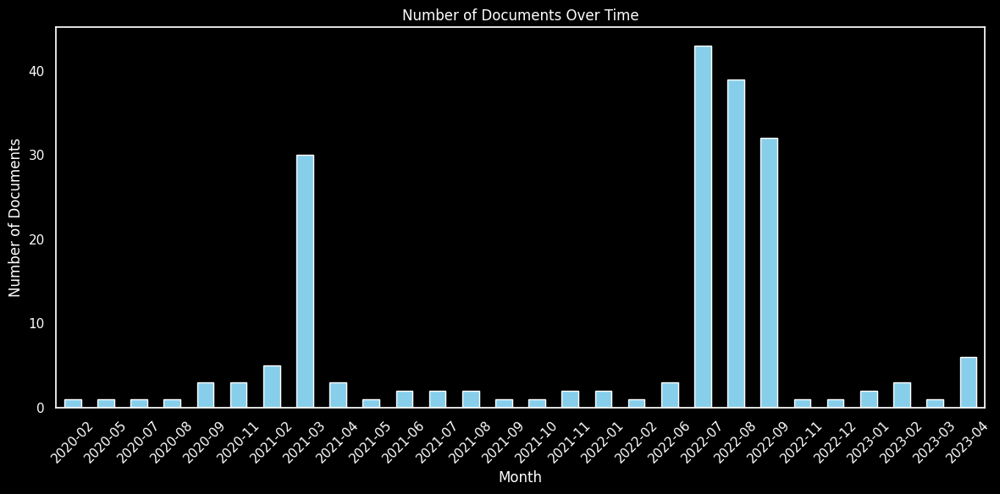

In [268]:
import matplotlib.pyplot as plt

insurance_df['date'] = pd.to_datetime(insurance_df['date'])

# Extract the month and year from the 'date' column
insurance_df['month_year'] = insurance_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = insurance_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [275]:
#insurance_df_feb2023 = insurance_df[insurance_df['month_year'] == '2022-07']
#insurance_df_feb2023.head(10)
#not great info

In [276]:
insurance_df_aug2022 = insurance_df[insurance_df['month_year'] == '2022-08']
#insurance_df_aug2022.head(10)
'''LOS ANGELES, Aug. 23, 2022 /PRNewswire/ -- FairPlay, the world's first "Fairness-as-a-Service" solution for algorithmic decision-making, today announced the launch of Input Intelligence, a bias detection product for insurance carriers. This is an expansion of FairPlay's existing fairness solutions for the financial services industry.

'''

'LOS ANGELES, Aug. 23, 2022 /PRNewswire/ -- FairPlay, the world\'s first "Fairness-as-a-Service" solution for algorithmic decision-making, today announced the launch of Input Intelligence, a bias detection product for insurance carriers. This is an expansion of FairPlay\'s existing fairness solutions for the financial services industry.\n\n'

In [277]:
'''Input Intelligence will also draw on FairPlay's redlining technology, which identifies unfair practices based on where people live so that insurance carriers can ensure their marketing and products are not excluding low- and moderate-income neighborhoods.

"Lenders use FairPlay because it's good for people, profits, and progress. Now, insurers can do the same," said Kareem Saleh, Founder & CEO of FairPlay. "Regulators and consumers are demanding more fairness from insurers than ever before. FairPlay's new Input Intelligence solution helps carriers debias their data and reach more customers in ways that are good for their company and the communities they serve."

'''

'Input Intelligence will also draw on FairPlay\'s redlining technology, which identifies unfair practices based on where people live so that insurance carriers can ensure their marketing and products are not excluding low- and moderate-income neighborhoods.\n\n"Lenders use FairPlay because it\'s good for people, profits, and progress. Now, insurers can do the same," said Kareem Saleh, Founder & CEO of FairPlay. "Regulators and consumers are demanding more fairness from insurers than ever before. FairPlay\'s new Input Intelligence solution helps carriers debias their data and reach more customers in ways that are good for their company and the communities they serve."\n\n'

In [278]:
df_analysis_sample =insurance_df

In [279]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 295 ms, sys: 13.2 s, total: 13.5 s
Wall time: 19.8 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [283]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


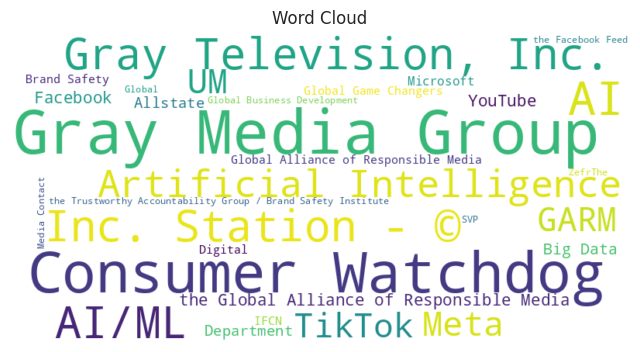

In [284]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


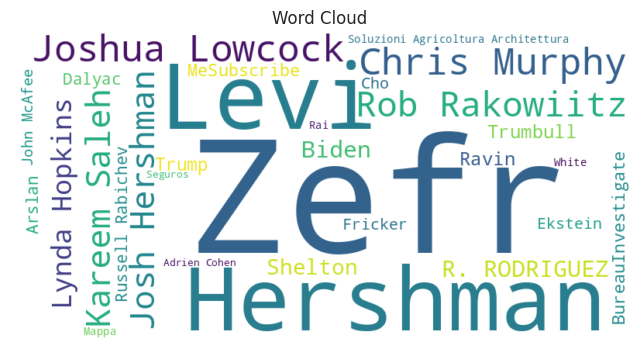

In [285]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


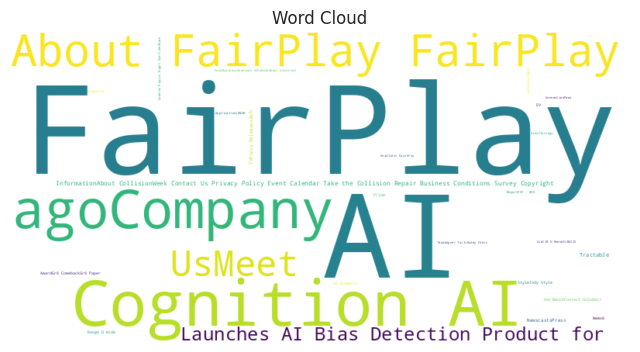

In [286]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 23 - patent inventor drug law

In [288]:
selected_topics = [23]
patent_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [290]:
patent_df.shape

(163, 11)

/var/tmp/ipykernel_5904/353805628.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patent_df['date'] = pd.to_datetime(patent_df['date'])
/var/tmp/ipykernel_5904/353805628.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patent_df['month_year'] = patent_df['date'].dt.to_period('M')


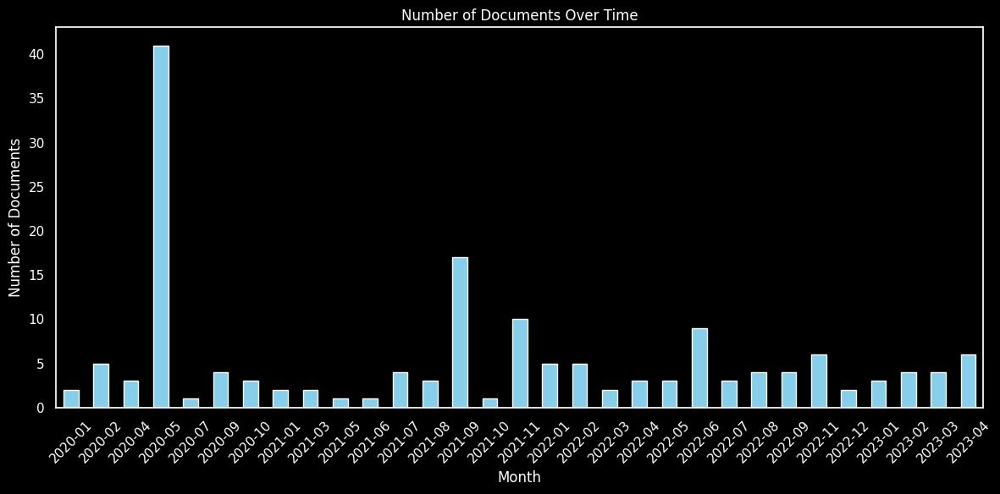

In [291]:
import matplotlib.pyplot as plt

patent_df['date'] = pd.to_datetime(patent_df['date'])

# Extract the month and year from the 'date' column
patent_df['month_year'] = patent_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = patent_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [295]:
patent_apr2020 = patent_df[patent_df['month_year'] == '2020-04']
#patent_apr2020.head(10)
#USPTO Says AI Cannot Be Legally Credited As An Inventor
'''While we cannot speak to the legal systems in other countries, as far as the USPTO is concerned, no, an AI cannot be legally credited as an inventor. This is based on a submission to the USPTO for a couple of patents – an emergency flashlight and a shape-shifting drink container – which were created by an AI system called DABUS.

The Artificial Inventor Project filed the patent invention on behalf of DABUS’ creator, Stephen Thaler, where they argued that since Thaler himself did not have any expertise in those types of products, he could not have come up with the ideas himself, and thus DABUS should be credited as the inventor of those patents.

'''

'While we cannot speak to the legal systems in other countries, as far as the USPTO is concerned, no, an AI cannot be legally credited as an inventor. This is based on a submission to the USPTO for a couple of patents – an emergency flashlight and a shape-shifting drink container – which were created by an AI system called DABUS.\n\nThe Artificial Inventor Project filed the patent invention on behalf of DABUS’ creator, Stephen Thaler, where they argued that since Thaler himself did not have any expertise in those types of products, he could not have come up with the ideas himself, and thus DABUS should be credited as the inventor of those patents.\n\n'

#### topic 27 agriculture

In [296]:
selected_topics = [27]
agriculture_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


/var/tmp/ipykernel_5904/138849741.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  agriculture_df['date'] = pd.to_datetime(agriculture_df['date'])
/var/tmp/ipykernel_5904/138849741.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  agriculture_df['month_year'] = agriculture_df['date'].dt.to_period('M')


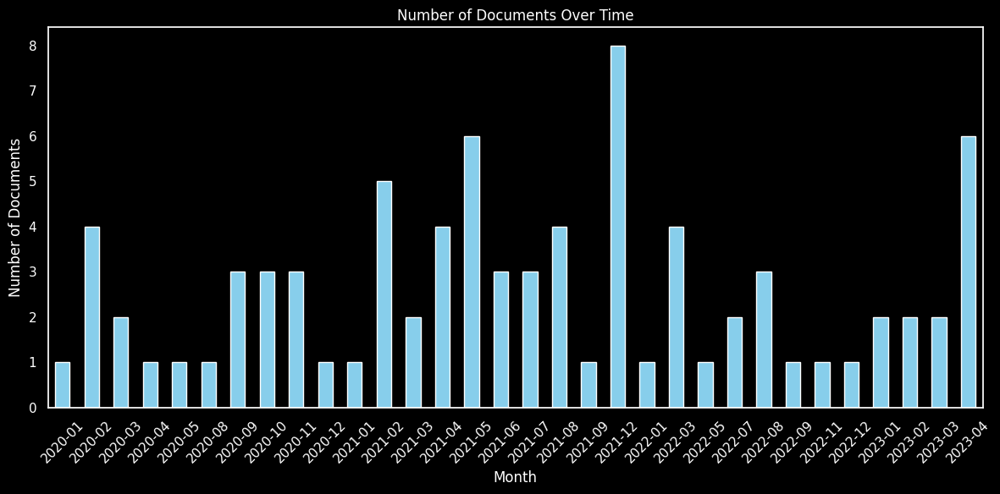

In [297]:
import matplotlib.pyplot as plt

agriculture_df['date'] = pd.to_datetime(agriculture_df['date'])

# Extract the month and year from the 'date' column
agriculture_df['month_year'] = agriculture_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = agriculture_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [299]:
df_analysis_sample = agriculture_df

In [300]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 355 ms, sys: 13.2 s, total: 13.5 s
Wall time: 18.9 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [302]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


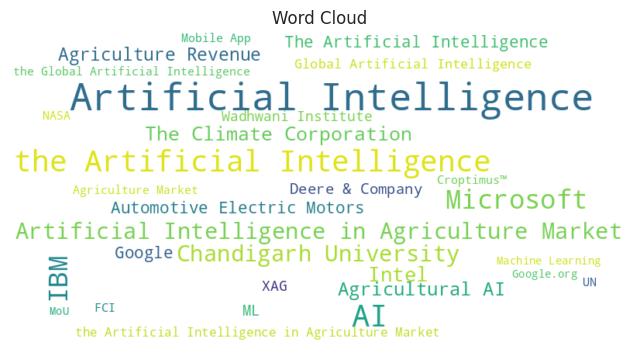

In [303]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


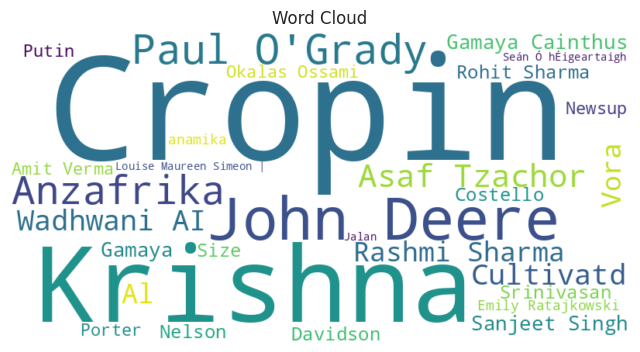

In [304]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


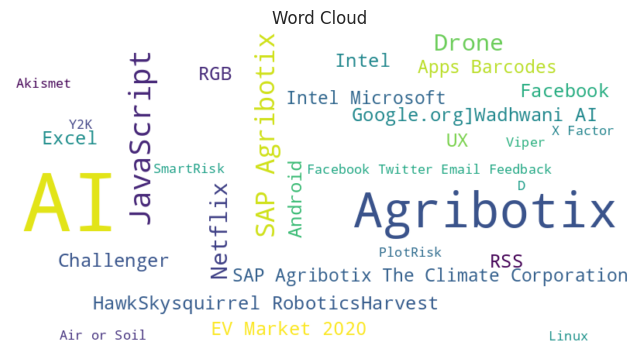

In [305]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [312]:
#same results from April 2021
agriculture_df_true = agriculture_df[agriculture_df['Representative_document'] == True]
# agriculture_df_true.head(3)
#global artificial intelligence ai agriculture market ibm intel microsoft sap agribotix
#challenges in effectively application of Artificial Intelligence (AI) for increasing crops’ cultivation which result in declining the overall crops yield followed by ultimate rising commodity prices in the country.
'''Firstly, the Agricultural Robots: It has the capacity to independently handle basic harvesting tasks at a faster pace with greater volume as compared to humans.

'''
'''Computers can use deep learning algorithms to store and process data captured by drones, GPS and field sensors installed in tractors etc.

regarding potential defects and nutrient deficiencies in the soil and crop. This data can be used to monitor the health and readiness of crop and soil with regard to certain defects and diseases. It would enable farmers to take appropriate measures.

'''
'''
Lastly, predictive analytics also have a role to play in the form of precision farming. Machine learning models can be used to track and predict external factors that impact the yield such as temperature changes, rainfall, wind speed and market shifts etc.

For example, an existing app in Pakistan already provides weather notifications, whereas machine learning can take this a step further by customizing the predictions based on the needs of each client. Challenges for Technology Adoption included:


'''

'\nLastly, predictive analytics also have a role to play in the form of precision farming. Machine learning models can be used to track and predict external factors that impact the yield such as temperature changes, rainfall, wind speed and market shifts etc.\n\nFor example, an existing app in Pakistan already provides weather notifications, whereas machine learning can take this a step further by customizing the predictions based on the needs of each client. Challenges for Technology Adoption included:\n\n\n'

In [318]:
filtered_agriculture_df = agriculture_df[agriculture_df['clean_title_x'].str.contains('agribotix', case=False, na=False)]
#filtered_agriculture_df.head(10)

#### topic 41 oil & gas

In [320]:
selected_topics = [41]
oil_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


/var/tmp/ipykernel_5904/4029900029.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  oil_df['date'] = pd.to_datetime(oil_df['date'])
/var/tmp/ipykernel_5904/4029900029.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  oil_df['month_year'] = oil_df['date'].dt.to_period('M')


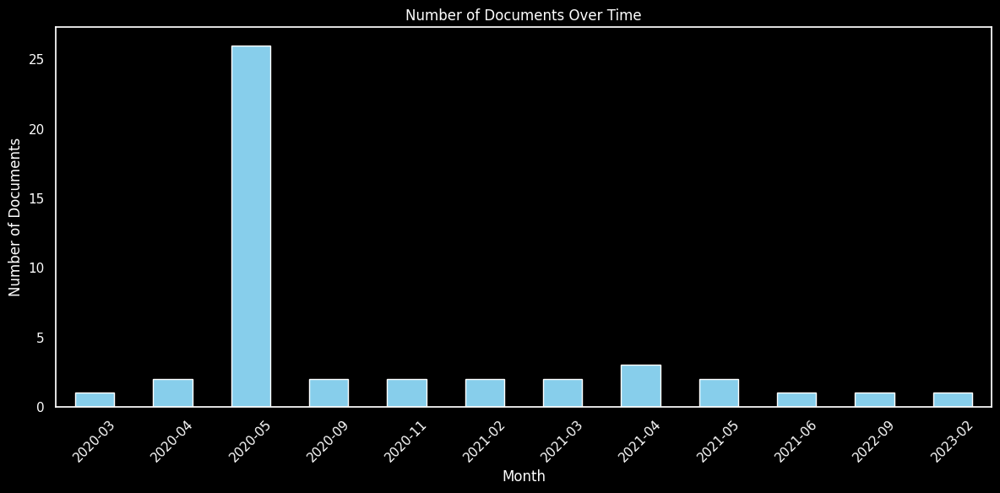

In [321]:
import matplotlib.pyplot as plt

oil_df['date'] = pd.to_datetime(oil_df['date'])

# Extract the month and year from the 'date' column
oil_df['month_year'] = oil_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = oil_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [328]:
oil_may2020 = oil_df[oil_df['month_year'] == '2020-05']
#oil_may2020.head(10)
#Google says it will no longer build custom artificial intelligence tools for speeding up oil and gas extraction, separating itself from cloud computing rivals Microsoft and Amazon.
'''The environmentalist group. Greenpeace, says Amazon, Microsoft and Google have been undermining their own climate change pledges by partnering with major oil companies including Shell, BP, Chevron and ExxonMobil that have looked for new technology to get more oil and gas out of the ground.'''


'The environmentalist group. Greenpeace, says Amazon, Microsoft and Google have been undermining their own climate change pledges by partnering with major oil companies including Shell, BP, Chevron and ExxonMobil that have looked for new technology to get more oil and gas out of the ground.'

In [329]:
'''Greenpeace’s report says Microsoft appears to be leading the way with the most oil and contracts, “offering AI capabilities in all phases of oil production.” Amazon’s contracts are more focused on pipelines, shipping and fuel storage, according to the report. Their tools have been deployed to speed up shale extraction, especially from the Permian Basin of Texas and New Mexico.

Some of the contracts have led to internal protests by employees who are pushing their companies to do more to combat climate change.

'''

'Greenpeace’s report says Microsoft appears to be leading the way with the most oil and contracts, “offering AI capabilities in all phases of oil production.” Amazon’s contracts are more focused on pipelines, shipping and fuel storage, according to the report. Their tools have been deployed to speed up shale extraction, especially from the Permian Basin of Texas and New Mexico.\n\nSome of the contracts have led to internal protests by employees who are pushing their companies to do more to combat climate change.\n\n'

In [330]:
df_analysis_sample = oil_df

In [331]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 262 ms, sys: 13.4 s, total: 13.6 s
Wall time: 17.9 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [332]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


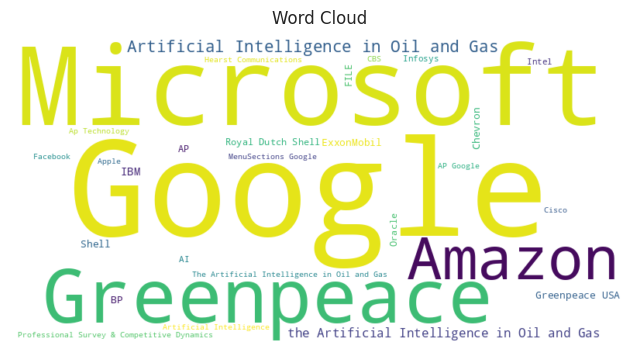

In [333]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


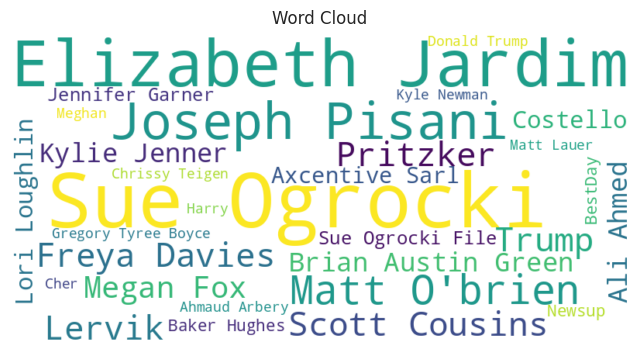

In [334]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


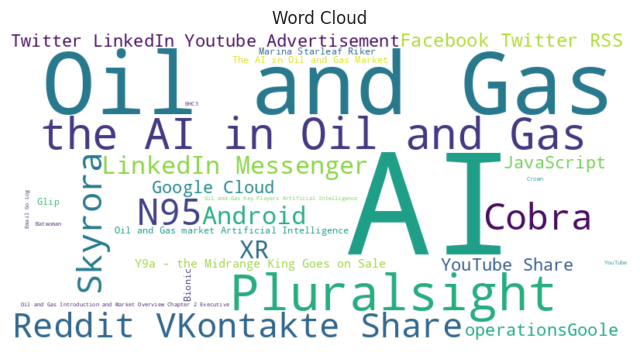

In [335]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### iot - intelligence topic 46

In [336]:
selected_topics = [46]
iot_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


/var/tmp/ipykernel_5904/2336288118.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iot_df['date'] = pd.to_datetime(iot_df['date'])
/var/tmp/ipykernel_5904/2336288118.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iot_df['month_year'] = iot_df['date'].dt.to_period('M')


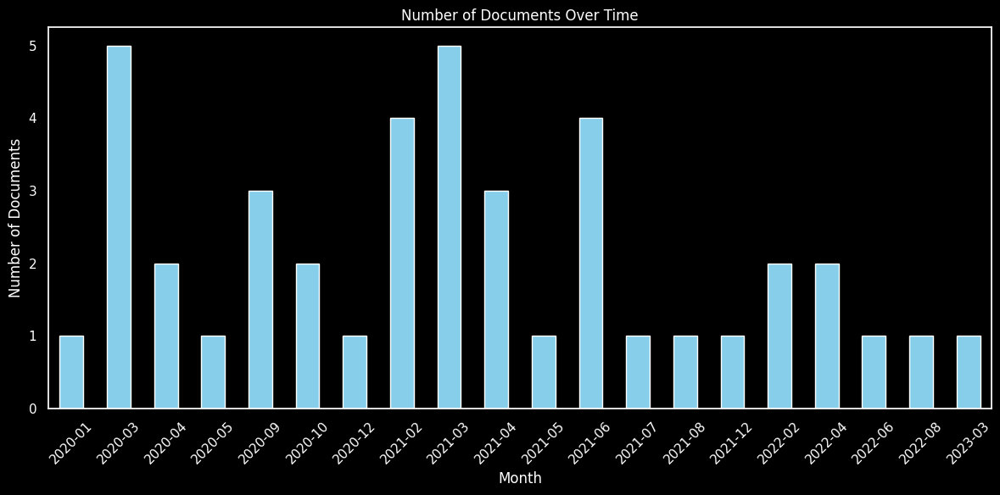

In [337]:
import matplotlib.pyplot as plt

iot_df['date'] = pd.to_datetime(iot_df['date'])

# Extract the month and year from the 'date' column
iot_df['month_year'] = iot_df['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = iot_df.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [338]:
df_analysis_sample = iot_df

In [339]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


<timed exec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

CPU times: user 278 ms, sys: 13.2 s, total: 13.5 s
Wall time: 16.9 s


<timed exec>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [340]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


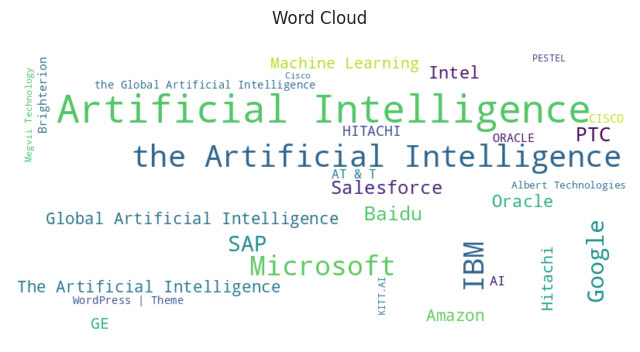

In [341]:
df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


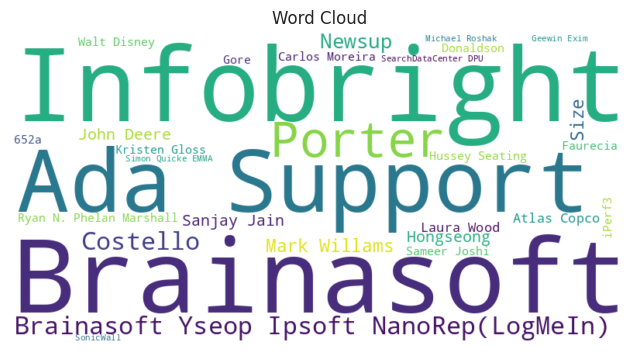

In [342]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


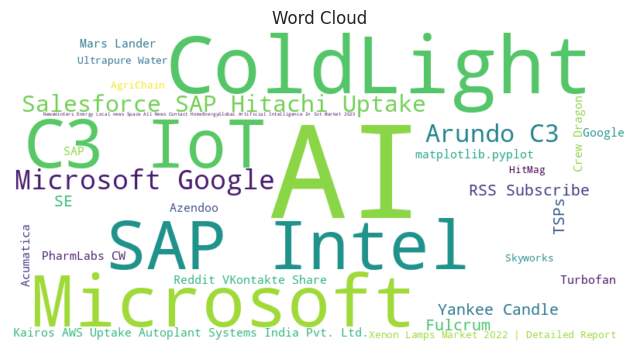

In [343]:
df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()

#leaders in IOT - nothing really negative here!

In [348]:
iot_df_true = iot_df[iot_df['Representative_document'] == True]
#iot_df_true.head(5)